
# High-Throughput Experimental Materials (HTEM) Database

The **High-Throughput Experimental Materials (HTEM) Database** hosted at [htem.nrel.gov](https://htem.nrel.gov) is a publicly accessible platform developed by the National Renewable Energy Laboratory (NREL). It provides a wealth of experimental data on materials synthesized and characterized through high-throughput methods. The database supports the discovery and optimization of novel materials by offering detailed information on composition, structure, processing conditions, and corresponding properties.

Researchers can leverage the HTEM database to:
- Explore large datasets for materials research.
- Identify trends in materials properties and synthesis conditions.
- Accelerate materials development using data-driven approaches.

For more information or to access the database, visit [htem.nrel.gov](https://htem.nrel.gov).



In [1]:
#Note: the API available online for accessing htem.nrel.gov did not work for us, so we updated it (credit Reid Wetherington)

# Setting Up the Library

To use the custom library, put the `lib` folder in your working directory (./)

In [1]:
#Append lib to your path so you get access to the libraries to navigate HTEM database
import sys
import pandas as pd
sys.path.append('./lib')
from library import Library #custom from ./lib
from sample import Sample #custom from ./lib
import seaborn 

# Downloading Libraries from the HTEM Database


The below script fetches all sample libraries from the HTEM database and organizes them into a DataFrame. It:

1. Queries the HTEM API for library metadata.
2. Uses the `Library` class to retrieve detailed properties.
3. Combines properties into a Pandas DataFrame.
4. Displays a progress bar with `tqdm`.

The final DataFrame (`all_libraries_df`) contains all retrieved library information for analysis.


In [2]:
comment this line and run to download all of the libraries - takes ~8 minutes to download

import urllib.request
import json
import pandas as pd
from tqdm.notebook import tqdm  # For Jupyter Notebook-compatible progress bar

def download_all_libraries():
    """
    Downloads all available libraries from the HTEM database and stores them in a DataFrame.
    Returns:
        libraries_df (pd.DataFrame): A DataFrame containing all the library data.
    """
    try:
        # Base URL to fetch all libraries
        url = 'https://htem-api.nrel.gov/api/sample_library'
        
        # Make a request to the API
        with urllib.request.urlopen(url) as response:
            data = json.load(response)
        
        # Extract library IDs
        library_ids = [library['id'] for library in data]
        
        # Create a list of Library objects using the Library class
        libraries = Library.search_by_ids(library_ids)
        
        # Initialize a list to store all library properties
        all_properties = []
        
        # Loop through each Library object and fetch its properties
        for lib in tqdm(libraries, desc="Downloading Libraries", unit="library"):
            lib_properties = lib.properties()
            if not lib_properties.empty:
                all_properties.append(lib_properties)
        
        # Concatenate all properties into a single DataFrame at the end
        if all_properties:
            libraries_df = pd.concat(all_properties, ignore_index=True)
        else:
            libraries_df = pd.DataFrame()
        
        return libraries_df
    
    except Exception as e:
        print(f"An error occurred while downloading libraries: {e}")
        return pd.DataFrame()

# Fetch all libraries and store them in a DataFrame
all_libraries_df = download_all_libraries()

# Display the DataFrame
if not all_libraries_df.empty:
    print("Successfully downloaded all libraries!")
else:
    print("No libraries were downloaded.")


SyntaxError: invalid syntax (4099324789.py, line 1)

In [3]:
# Save the DataFrame to a Parquet file
comment this line and run to save the data to a parquet file
if not all_libraries_df.empty:
    output_file = "HTEM_all_libraries.parquet"
    all_libraries_df.to_parquet(output_file, engine='pyarrow', index=False)
    print(f"DataFrame successfully saved to {output_file}")
else:
    print("DataFrame is empty. Nothing to save.")


SyntaxError: invalid syntax (952065034.py, line 2)

In [4]:
#Load the dataframe back into memory
import pandas as pd

# File path to the Parquet file
input_file = "HTEM_all_libraries.parquet"

# Read the Parquet file into a DataFrame
try:
    all_libraries_df = pd.read_parquet(input_file, engine='pyarrow')
    print("DataFrame successfully loaded from Parquet file.")
except FileNotFoundError:
    print(f"The file {input_file} was not found.")
except Exception as e:
    print(f"An error occurred while reading the Parquet file: {e}")


DataFrame successfully loaded from Parquet file.


In [5]:
all_libraries_df.keys()

Index(['id', 'num', 'pdac', 'quality', 'person_id', 'sample_date',
       'owner_name', 'owner_email', 'xrf_type', 'sputter_operator',
       'sample_ids', 'elements', 'xrf_elements', 'xrf_compounds',
       'deposition_sample_time_min', 'deposition_compounds',
       'deposition_power', 'deposition_base_pressure_mtorr',
       'deposition_growth_pressure_mtorr', 'deposition_target_pulses',
       'deposition_rep_rate', 'deposition_energy', 'deposition_cycles',
       'deposition_ts_distance', 'deposition_initial_temp_c', 'box_number',
       'deposition_gases', 'deposition_substrate_material',
       'deposition_gas_flow_sccm', 'has_xrd', 'has_xrf', 'has_ele', 'has_opt',
       'data_access'],
      dtype='object')

In [6]:
max(all_libraries_df['has_opt'])

177

# Examine Dataset

## Composition and XRD Data

1. **Elemental Composition**:
- Visualize the distribution of elements (by atomic number) present in the database.

2. **XRD Data Coverage**:
- Show the fraction of measurements that include XRD data.

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

def visualize_composition_and_xrd(libraries_df):
    """
    Visualizes:
    1. Elemental composition based on atomic number.
    2. Availability of XRD data.
    """
    # Ensure DataFrame is not empty
    if libraries_df.empty:
        print("The library data is empty. Cannot create visualizations.")
        return
    
    # Elemental Composition (Atomic Number Distribution)
    if 'elements' in libraries_df.columns:
        # Flatten the list of elements for all libraries and calculate frequencies
        elemental_data = libraries_df['elements'].dropna().explode()
        elemental_counts = elemental_data.value_counts().sort_index()
        
        plt.figure(figsize=(10, 6))
        plt.bar(elemental_counts.index, elemental_counts.values, width=0.8)
        plt.title("Elemental Composition by Atomic Number", fontsize=14)
        plt.xlabel("Atomic Number", fontsize=12)
        plt.ylabel("Frequency", fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()
    else:
        print("No elemental composition data available.")
    
    # Availability of XRD Data
    if 'has_xrd' in libraries_df.columns:
        xrd_availability = libraries_df['has_xrd'] > 0
        xrd_summary = xrd_availability.value_counts()
        
        plt.figure(figsize=(6, 6))
        plt.pie(
            xrd_summary.values,
            labels=["XRD Available", "No XRD Data"],
            autopct='%1.1f%%',
            startangle=140,
            colors=['#76c7c0', '#f88a8a']
        )
        plt.title("Availability of XRD Data", fontsize=14)
        plt.show()
    else:
        print("No XRD data information available.")


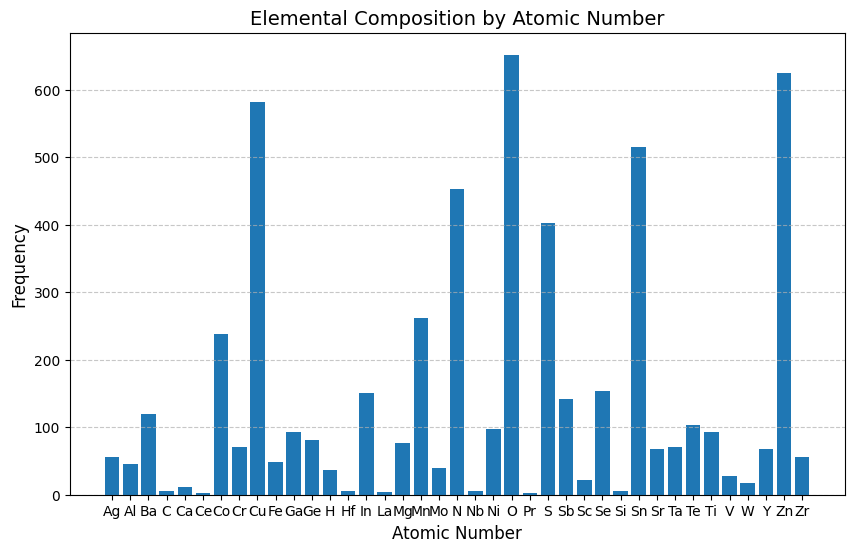

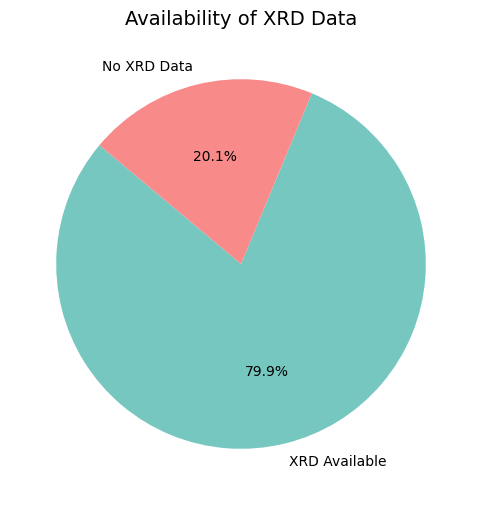

In [8]:
visualize_composition_and_xrd(all_libraries_df)

### Visualizing Optical and Electronic Data

This script analyzes data from the HTEM database by:

1. **Data Availability**:
   - Visualizing the proportion of libraries with optical data, electronic data, both, or neither.

2. **Purpose**:
   - Provides insights into the coverage of optical and electronic measurements in the database.

In [9]:
def visualize_electronic_and_optical(libraries_df):
    """
    Visualizes:
    1. Proportion of libraries with optical and electronic data.
    2. Distribution of optical band gap and electronic conductivity.
    """
    # Ensure DataFrame is not empty
    if libraries_df.empty:
        print("The library data is empty. Cannot create visualizations.")
        return
    
    # Filter libraries with optical or electronic data
    optical_libraries = libraries_df[libraries_df['has_opt'] > 0]
    electronic_libraries = libraries_df[libraries_df['has_ele'] > 0]
    both_data_libraries = libraries_df[(libraries_df['has_opt'] > 0) & (libraries_df['has_ele'] > 0)]
    
    # Summary visualization
    categories = {
        "Optical Only": len(optical_libraries) - len(both_data_libraries),
        "Electronic Only": len(electronic_libraries) - len(both_data_libraries),
        "Both Optical and Electronic": len(both_data_libraries),
        "Neither": len(libraries_df) - len(optical_libraries) - len(electronic_libraries)
    }
    
    # Pie chart for data availability
    plt.figure(figsize=(8, 8))
    plt.pie(
        categories.values(),
        labels=categories.keys(),
        autopct='%1.1f%%',
        startangle=140,
        colors=['#76c7c0', '#f88a8a', '#fbd46d', '#adb5bd']
    )
    plt.title("Proportion of Libraries with Optical and Electronic Data", fontsize=14)
    plt.show()


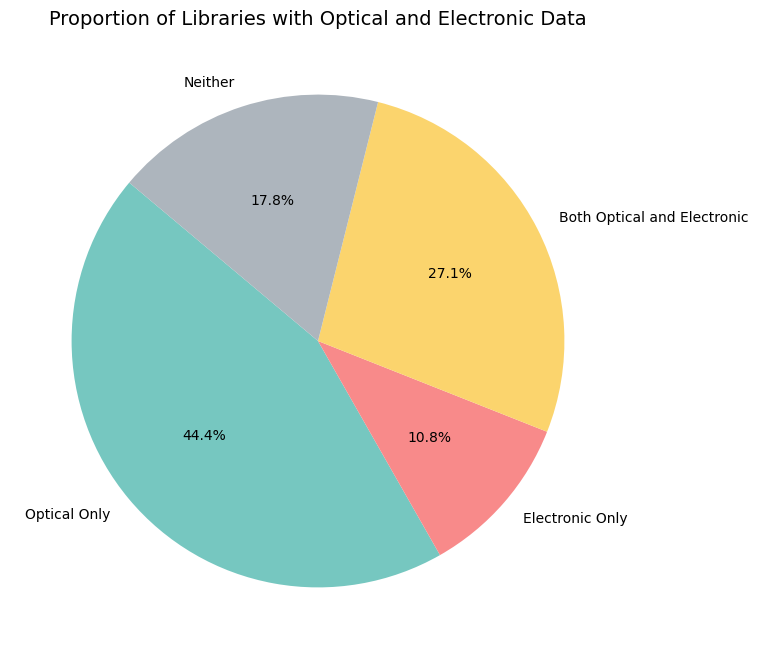

In [12]:
visualize_electronic_and_optical(all_libraries_df)

# How to deal with Missing Data

Reference: [IEEE Article](https://ieeexplore.ieee.org/stamp/stamp.jsp)

Approaches to handle missing data include:

1. **Discard**: Ignore instances with missing data inputs.
2. **Default**: Use a predefined value (user/system-defined) as a substitute.
3. **Historic Data**: Utilize prior complete data or previously observed missing data patterns.
4. **Current Data**: Leverage data from other present instances where the missing data inputs are available.
5. **A Priori**: Apply external high-level knowledge about the data.
6. **Prediction**: Combine any of the above methods with the current observed data to estimate missing values.


# Here, our goal will be to predict electronic data from other data (e.g. optical to start)

## Filtering Libraries with Both Optical and Electronic Data

After visualizing the proportion of libraries containing optical and electronic data, the next step is to focus on libraries that include both data types. This script:

1. **Purpose**:
   - Identifies and extracts entries from the HTEM database that contain **UV-vis optical data** and **electronic conductivity data**.

2. **Process**:
   - Ensures the dataset is not empty and contains the required columns (`has_opt` and `has_ele`).
   - Filters the DataFrame to include only rows where both data types are available.

3. **Output**:
   - Returns a new DataFrame (`filtered_libraries_df`) with libraries having both optical and electronic data for targeted analysis.

This step narrows the dataset to focus on entries rich in complementary data for deeper exploration.


In [10]:
import pandas as pd

def filter_libraries_with_optical_and_electronic_data(libraries_df):
    """
    Filters the libraries DataFrame to only include entries with both
    UV-vis optical data and electronic conductivity data based on `has_opt` and `has_ele` counts.
    
    Args:
        libraries_df (pd.DataFrame): The DataFrame containing library data.
    
    Returns:
        pd.DataFrame: Filtered DataFrame with only entries containing both data types.
    """
    # Ensure DataFrame is not empty
    if libraries_df.empty:
        print("The library data is empty.")
        return pd.DataFrame()
    
    # Check for required columns
    required_columns = ['has_opt', 'has_ele']
    for column in required_columns:
        if column not in libraries_df.columns:
            print(f"Required column '{column}' is missing.")
            return pd.DataFrame()
    
    # Filter rows where both optical and electronic data counts are greater than 0
    filtered_df = libraries_df[(libraries_df['has_opt'] > 0) & (libraries_df['has_ele'] > 0)]
    
    return filtered_df

# Example usage with a sample DataFrame
# Assuming `all_libraries_df` contains columns `has_opt` and `has_ele`.
filtered_libraries_df = filter_libraries_with_optical_and_electronic_data(all_libraries_df)

# Display the filtered DataFrame
if not filtered_libraries_df.empty:
    print("Libraries with both UV-vis optical data and electronic conductivity data:")
    print(filtered_libraries_df)
else:
    print("No libraries with both UV-vis optical data and electronic conductivity data found.")


Libraries with both UV-vis optical data and electronic conductivity data:
         id   num pdac  quality  person_id               sample_date  \
11     6824    34    4      3.0       52.0  2013-03-05T00:00:00.000Z   
12    12713  2460    1      NaN        NaN  2019-01-22T00:00:00.000Z   
16    12719  2463    1      NaN        NaN  2019-01-28T00:00:00.000Z   
44     8850   220    4      3.0        NaN                      None   
128    8015  1099    3      3.0        NaN  2018-05-03T00:00:00.000Z   
...     ...   ...  ...      ...        ...                       ...   
1863   6890   333    4      3.0       52.0                      None   
1864   6977   334    4      3.0       52.0  2013-12-10T00:00:00.000Z   
1869   8883   341    4      3.0       53.0  2013-12-12T00:00:00.000Z   
1870   8884   350    4      3.0       32.0                      None   
1884   7001    37    4      3.0       53.0  2013-03-18T00:00:00.000Z   

             owner_name                owner_email xrf_type s

## Downloading and Combining Library Data

This script retrieves detailed data for the filtered libraries from the HTEM database. It:

1. **Purpose**:
   - Downloads raw data for each library and its samples.
   - Combines the raw data with library metadata into a single DataFrame.

2. **Process**:
   - Loops through filtered libraries and samples, handling errors and retries.
   - Uses progress bars (`tqdm`) for real-time updates on download status.

3. **Output**:
   - Creates a comprehensive DataFrame (`combined_libraries_data_df`) with all retrieved data.
   - Saves the result to a file for future analysis.

This ensures all relevant data is aggregated for detailed exploration.


In [11]:
comment this line and execute to download all of NREL data - takes >1 hrs

import pandas as pd
import urllib.request
import json
from urllib.error import HTTPError, URLError
from http.client import RemoteDisconnected
from tqdm.notebook import tqdm  # Importing tqdm for a Jupyter-compatible progress bar


def download_library_data(filtered_libraries_df, retries=3, backoff=5):
    """
    Loops through filtered libraries and downloads all raw data for each entry.
    Combines the data into a single DataFrame, retaining columns from the filtered DataFrame.

    Args:
        filtered_libraries_df (pd.DataFrame): Filtered libraries DataFrame.
        retries (int): Number of retries for failed requests.
        backoff (int): Delay in seconds between retries.

    Returns:
        pd.DataFrame: Combined DataFrame with all raw data and library metadata.
    """
    if filtered_libraries_df.empty:
        return pd.DataFrame()

    combined_data = []  # List to store combined data rows
    library_failures = 0  # Count of failed library downloads
    sample_failures = 0  # Count of failed sample downloads
    sample_successes = 0  # Count of successful sample downloads

    # Loop through each row in the filtered libraries DataFrame
    library_tqdm = tqdm(filtered_libraries_df.iterrows(),
                         total=filtered_libraries_df.shape[0],
                         desc="Processing Libraries",
                         unit="library")

    for _, row in library_tqdm:
        library_id = row['id']  # Extract the library ID
        try:
            # Fetch library properties
            library_url = f'https://htem-api.nrel.gov/api/sample_library/{library_id}'
            try:
                with urllib.request.urlopen(library_url) as response:
                    library_data = json.load(response)
            except HTTPError as e:
                if e.code == 400:  # Specific handling for HTTP 400 Bad Request
                    library_failures += 1
                    library_tqdm.set_postfix(library_failures=library_failures)
                    continue
                else:
                    raise  # Re-raise other HTTP errors

            # Get sample IDs from the library data
            sample_ids = library_data.get('sample_ids', [])
            if not sample_ids:
                continue  # Skip if no sample IDs are found

            # Loop through each sample in the library
            sample_tqdm = tqdm(sample_ids, desc=f"Processing Samples for Library {library_id}", leave=False, unit="sample")
            for sample_id in sample_tqdm:
                sample_url = f'https://htem-api.nrel.gov/api/sample/{sample_id}'
                try:
                    with urllib.request.urlopen(sample_url) as response:
                        sample_data = json.load(response)

                    # Ensure valid data before appending
                    if sample_data:
                        sample_successes += 1
                        # Combine sample data with the library metadata
                        combined_row = {**row.to_dict(), **sample_data}
                        combined_data.append(combined_row)
                    else:
                        sample_failures += 1

                    # Update the progress bar postfix
                    sample_tqdm.set_postfix(sample_successes=sample_successes, sample_failures=sample_failures)
                except (HTTPError, URLError, RemoteDisconnected):
                    sample_failures += 1
                    sample_tqdm.set_postfix(sample_successes=sample_successes, sample_failures=sample_failures)
                    continue

        except (URLError, RemoteDisconnected):
            library_failures += 1
            library_tqdm.set_postfix(library_failures=library_failures)
            continue

    # Create a combined DataFrame
    combined_df = pd.DataFrame(combined_data) if combined_data else pd.DataFrame()
    return combined_df


# Download data for filtered libraries and combine into one DataFrame
combined_libraries_data_df = download_library_data(filtered_libraries_df)

SyntaxError: invalid syntax (3095386817.py, line 1)

In [12]:
# Save the combined DataFrame to a file for future use
comment this line and run to save the library data with optical and electronic data
if not combined_libraries_data_df.empty:
    output_file = "Filtered_Libraries_Data.parquet"
    combined_libraries_data_df.to_parquet(output_file, engine='pyarrow', index=False)

SyntaxError: invalid syntax (2719617558.py, line 2)

In [1]:
#Reload combined_libraries_data_df
import pandas as pd

# Define the path to the Parquet file
input_file = "Filtered_Libraries_Data.parquet"

# Read the Parquet file into a DataFrame
try:
    combined_libraries_data_df = pd.read_parquet(input_file, engine='pyarrow')
    print("Parquet file successfully read into a DataFrame.")
except FileNotFoundError:
    print(f"Error: The file '{input_file}' was not found.")
except Exception as e:
    print(f"An error occurred while reading the Parquet file: {e}")

# Display the first few rows of the DataFrame (optional)
print(combined_libraries_data_df.keys(), len(combined_libraries_data_df))


Parquet file successfully read into a DataFrame.
Index(['id', 'num', 'pdac', 'quality', 'person_id', 'sample_date',
       'owner_name', 'owner_email', 'xrf_type', 'sputter_operator',
       'sample_ids', 'elements', 'xrf_elements', 'xrf_compounds',
       'deposition_sample_time_min', 'deposition_compounds',
       'deposition_power', 'deposition_base_pressure_mtorr',
       'deposition_growth_pressure_mtorr', 'deposition_target_pulses',
       'deposition_rep_rate', 'deposition_energy', 'deposition_cycles',
       'deposition_ts_distance', 'deposition_initial_temp_c', 'box_number',
       'deposition_gases', 'deposition_substrate_material',
       'deposition_gas_flow_sccm', 'has_xrd', 'has_xrf', 'has_ele', 'has_opt',
       'data_access', 'sample_library_id', 'position', 'thickness',
       'xrf_concentration', 'xrd_angle', 'xrd_background', 'xrd_intensity',
       'fpm_voltage_volts', 'fpm_current_amps', 'fpm_sheet_resistance',
       'fpm_standard_deviation', 'fpm_resistivity', 'f

# Scatter Plot: Electrical Conductivity vs. Optical Bandgap

This code visualizes the relationship between electrical conductivity and optical direct bandgap:

1. **Data Check**:
   - Ensures `fpm_conductivity` and `opt_direct_bandgap` columns exist and filters valid numeric data.

2. **Plot**:
   - Bandgap (x-axis) vs. conductivity (y-axis) with a logarithmic scale.
   - Includes labels, a title, and a grid for clarity.

The plot reveals trends between optical and electronic properties.

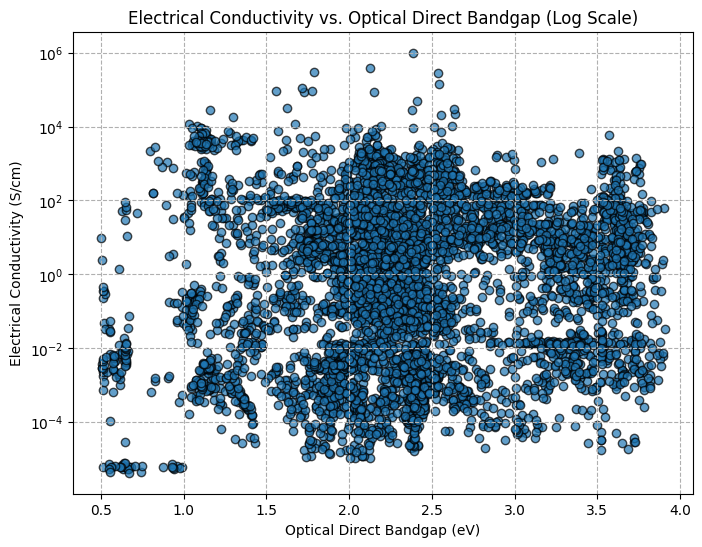

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Check if the necessary columns are in the DataFrame
if 'fpm_conductivity' in combined_libraries_data_df.columns and 'opt_direct_bandgap' in combined_libraries_data_df.columns:
    # Extract non-null conductivity and bandgap data
    filtered_data = combined_libraries_data_df[['fpm_conductivity', 'opt_direct_bandgap']].dropna()

    # Convert to numeric for plotting, handling potential non-numeric entries
    filtered_data['fpm_conductivity'] = pd.to_numeric(filtered_data['fpm_conductivity'], errors='coerce')
    filtered_data['opt_direct_bandgap'] = pd.to_numeric(filtered_data['opt_direct_bandgap'], errors='coerce')
    filtered_data = filtered_data.dropna()  # Drop rows with non-numeric data
    
    conductivities = filtered_data['fpm_conductivity']
    bandgaps = filtered_data['opt_direct_bandgap']

    # Plotting the data with a log scale for the y-axis
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(bandgaps, conductivities, alpha=0.7, edgecolors='k')
    plt.xscale('linear')
    plt.yscale('log')  # Setting y-axis to logarithmic scale
    plt.xlabel('Optical Direct Bandgap (eV)')
    plt.ylabel('Electrical Conductivity (S/cm)')
    plt.title('Electrical Conductivity vs. Optical Direct Bandgap (Log Scale)')
    plt.grid(True, which="both", ls="--")
    plt.show()
else:
    print("The required columns ('fpm_conductivity', 'opt_direct_bandgap') are not present in the DataFrame.")


# Electrical Conductivity Model Equation

The electrical conductivity, $\sigma$, of a seminconductor is given by the equation:

$$
\sigma = \frac{A}{T^{3/2}} \exp\left(-\frac{E_g}{2kT}\right)
$$

#### Where:
- $\sigma$: Electrical conductivity
- $A$: Pre-exponential factor (material-dependent constant)
- $T$: Temperature in Kelvin (K)
- $E_g$: Bandgap energy (eV)
- $k$: Boltzmann constant $\left(8.617 \times 10^{-5} \, \text{eV/K}\right)$
- $\exp$: Exponential function

This equation describes the temperature dependence of electrical conductivity for semiconductors, incorporating the influence of the bandgap energy and thermal effects.


In [94]:
combined_libraries_data_df.keys()

Index(['id', 'num', 'pdac', 'quality', 'person_id', 'sample_date',
       'owner_name', 'owner_email', 'xrf_type', 'sputter_operator',
       'sample_ids', 'elements', 'xrf_elements', 'xrf_compounds',
       'deposition_sample_time_min', 'deposition_compounds',
       'deposition_power', 'deposition_base_pressure_mtorr',
       'deposition_growth_pressure_mtorr', 'deposition_target_pulses',
       'deposition_rep_rate', 'deposition_energy', 'deposition_cycles',
       'deposition_ts_distance', 'deposition_initial_temp_c', 'box_number',
       'deposition_gases', 'deposition_substrate_material',
       'deposition_gas_flow_sccm', 'has_xrd', 'has_xrf', 'has_ele', 'has_opt',
       'data_access', 'sample_library_id', 'position', 'thickness',
       'xrf_concentration', 'xrd_angle', 'xrd_background', 'xrd_intensity',
       'fpm_voltage_volts', 'fpm_current_amps', 'fpm_sheet_resistance',
       'fpm_standard_deviation', 'fpm_resistivity', 'fpm_conductivity',
       'absolute_temp_c', 'ele_

In [97]:
combined_libraries_data_df['opt_direct_bandgap']

0        2.2270
1        2.3480
2        2.2580
3        2.1930
4        2.1810
          ...  
14658    1.4000
14659    1.3850
14660    1.3720
14661    1.4290
14662    0.6641
Name: opt_direct_bandgap, Length: 14663, dtype: float64

### Predicted vs. Measured Conductivity

This code compares measured and predicted electrical conductivity:

1. **Prediction Model**:
   - Uses a temperature-dependent exponential model to calculate predicted conductivity.

2. **Data Check**:
   - Ensures required columns exist and filters valid data.

3. **Plot**:
   - Log-log scatter plot of predicted vs. measured conductivity.
   - Includes a reference line for perfect predictions (`y = x`).

This highlights the accuracy of the conductivity prediction model.


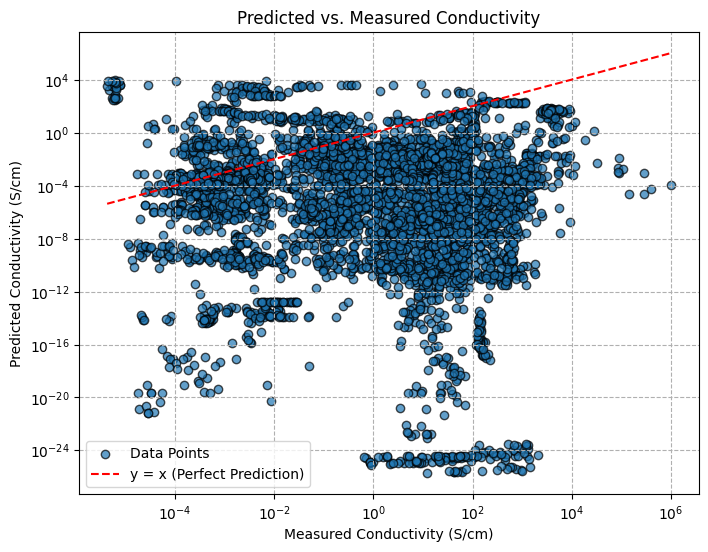

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
A = 1e10  # Assumed constant A in the equation
k_B = 8.617333262145e-5  # Boltzmann constant in eV/K

# Ensure the required columns are present
if 'opt_direct_bandgap' in combined_libraries_data_df.columns and 'absolute_temp_c' in combined_libraries_data_df.columns and 'fpm_conductivity' in combined_libraries_data_df.columns:
    # Filter rows with non-null values in the required columns
    filtered_data = combined_libraries_data_df[['opt_direct_bandgap', 'absolute_temp_c', 'fpm_conductivity']].dropna()

    # Convert temperature to Kelvin
    filtered_data['absolute_temp_k'] = filtered_data['absolute_temp_c'] + 273.15

    # Calculate predicted conductivity
    filtered_data['predicted_conductivity'] = (
        A / filtered_data['absolute_temp_k'] ** (3 / 2) *
        np.exp(-filtered_data['opt_direct_bandgap'] / (2 * k_B * filtered_data['absolute_temp_k']))
    )

    # Extract measured and predicted conductivity
    measured_conductivity = filtered_data['fpm_conductivity']
    predicted_conductivity = filtered_data['predicted_conductivity']

    # Plot predicted vs. measured conductivity
    plt.figure(figsize=(8, 6))
    plt.scatter(measured_conductivity, predicted_conductivity, alpha=0.7, edgecolors='k', label="Data Points")
    plt.plot([measured_conductivity.min(), measured_conductivity.max()],
             [measured_conductivity.min(), measured_conductivity.max()],
             color='red', linestyle='--', label="y = x (Perfect Prediction)")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Measured Conductivity (S/cm)')
    plt.ylabel('Predicted Conductivity (S/cm)')
    plt.title('Predicted vs. Measured Conductivity')
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()
else:
    print("The required columns ('opt_direct_bandgap', 'absolute_temp_c', 'fpm_conductivity') are not present in the DataFrame.")


## Optimizing Preexponential factor

This code refines the prediction of electrical conductivity:

1. **Model**:
   - Models conductivity as a function of bandgap, temperature, and a parameter \( A \).

2. **Optimization**:
   - Uses measured data to optimize \( A \) by minimizing the difference between predicted and measured conductivities.

3. **Plot**:
   - Log-log scatter plot of optimized predicted vs. measured conductivity.
   - Includes a reference line for perfect predictions (`y = x`).

This approach improves the accuracy of the conductivity prediction model.


Optimized value of A: 147490908.3754028


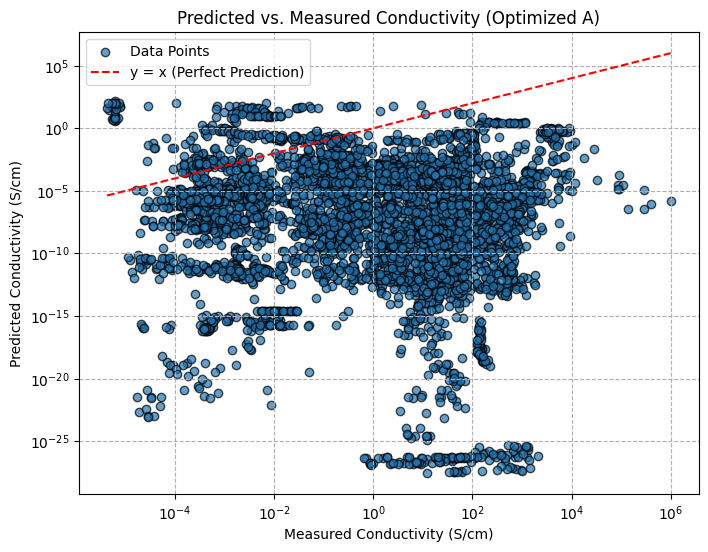

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize

# Constants
k_B = 8.617e-5  # Boltzmann constant in eV/K

# Function to model the electrical conductivity based on the bandgap and parameter A
def conductivity_model(bandgap, temperature, A):
    return A * temperature**(-1.5) * np.exp(-bandgap / (2 * k_B * temperature))

# Objective function to minimize: sum of squared differences between measured and calculated conductivities
def objective_function(A, bandgaps, temperatures, measured_conductivities):
    calculated_conductivities = conductivity_model(bandgaps, temperatures, A)
    return np.sum((measured_conductivities - calculated_conductivities)**2)

# Ensure required columns are present
if 'opt_direct_bandgap' in combined_libraries_data_df.columns and 'absolute_temp_c' in combined_libraries_data_df.columns and 'fpm_conductivity' in combined_libraries_data_df.columns:
    # Filter rows with non-null values in the required columns
    filtered_data = combined_libraries_data_df[['opt_direct_bandgap', 'absolute_temp_c', 'fpm_conductivity']].dropna()

    # Convert temperature to Kelvin
    filtered_data['absolute_temp_k'] = filtered_data['absolute_temp_c'] + 273.15

    # Extract measured conductivity, bandgap, and temperature
    measured_conductivities = filtered_data['fpm_conductivity'].values
    bandgaps = filtered_data['opt_direct_bandgap'].values
    temperatures = filtered_data['absolute_temp_k'].values

    # Ensure valid values (positive conductivities and bandgaps)
    valid_indices = (measured_conductivities > 0) & (bandgaps > 0) & (temperatures > 0)
    measured_conductivities = measured_conductivities[valid_indices]
    bandgaps = bandgaps[valid_indices]
    temperatures = temperatures[valid_indices]

    # Define initial guess for A
    initial_A = 1e20

    # Minimize the objective function
    result = minimize(
        objective_function,
        initial_A,
        args=(bandgaps, temperatures, measured_conductivities),
        method='Nelder-Mead'
    )

    # Extract the optimized value of A
    optimized_A = result.x[0]
    print(f"Optimized value of A: {optimized_A}")

    # Calculate predicted conductivities using the optimized A
    predicted_conductivities = conductivity_model(bandgaps, temperatures, optimized_A)

    # Plot predicted vs. measured conductivity
    plt.figure(figsize=(8, 6))
    plt.scatter(measured_conductivities, predicted_conductivities, alpha=0.7, edgecolors='k', label="Data Points")
    plt.plot([measured_conductivities.min(), measured_conductivities.max()],
             [measured_conductivities.min(), measured_conductivities.max()],
             color='red', linestyle='--', label="y = x (Perfect Prediction)")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Measured Conductivity (S/cm)')
    plt.ylabel('Predicted Conductivity (S/cm)')
    plt.title('Predicted vs. Measured Conductivity (Optimized A)')
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()
else:
    print("The required columns ('opt_direct_bandgap', 'absolute_temp_c', 'fpm_conductivity') are not present in the DataFrame.")


# Is the bandgap measurement incorrect?

## Tauc Plot - Band gap from optical data

A **Tauc plot** is a graphical method used to determine the optical bandgap (Tauc bandgap) of amorphous or disordered semiconductors. In a typical Tauc plot for amorphous materials, the photon energy (E = hν) is plotted on the x‑axis and (αE)<sup>1/2</sup> (where α is the absorption coefficient) on the y‑axis. Extrapolating the linear region of the plot to the x‑axis yields the optical bandgap.

For crystalline semiconductors, a similar approach is taken but with the y‑axis given by (α)<sup>1/r</sup>, where the exponent depends on the nature of the electronic transition:
- **r = 1/2** for direct allowed transitions
- **r = 3/2** for direct forbidden transitions
- **r = 2** for indirect allowed transitions
- **r = 3** for indirect forbidden transitions

Below is an example Tauc plot for a film of amorphous Si (optical bandgap ~0.8 eV). The inset shows the corresponding transmittance/reflectance spectra.

![Tauc plot of amorphous Si](https://upload.wikimedia.org/wikipedia/commons/thumb/0/07/TaucPlot_of_a-Si.svg/300px-TaucPlot_of_a-Si.svg.png)

For more details, please see the [Wikipedia page on Tauc plots](https://en.wikipedia.org/wiki/Tauc_plot).


In [ ]:
# 

### Optical Transmittance Heatmap

This code visualizes optical transmittance data:

1. **Data Preparation**:
   - Filters rows with valid wavelength and normalized transmittance data.
   - Normalizes transmittance values to the range [0, 1].

2. **Interpolation**:
   - Aligns all transmittance data to a common wavelength grid for consistency.

3. **Heatmap**:
   - Displays normalized transmittance as a heatmap, with wavelength on the x-axis and sample index on the y-axis.

This visualization highlights patterns in transmittance across samples.


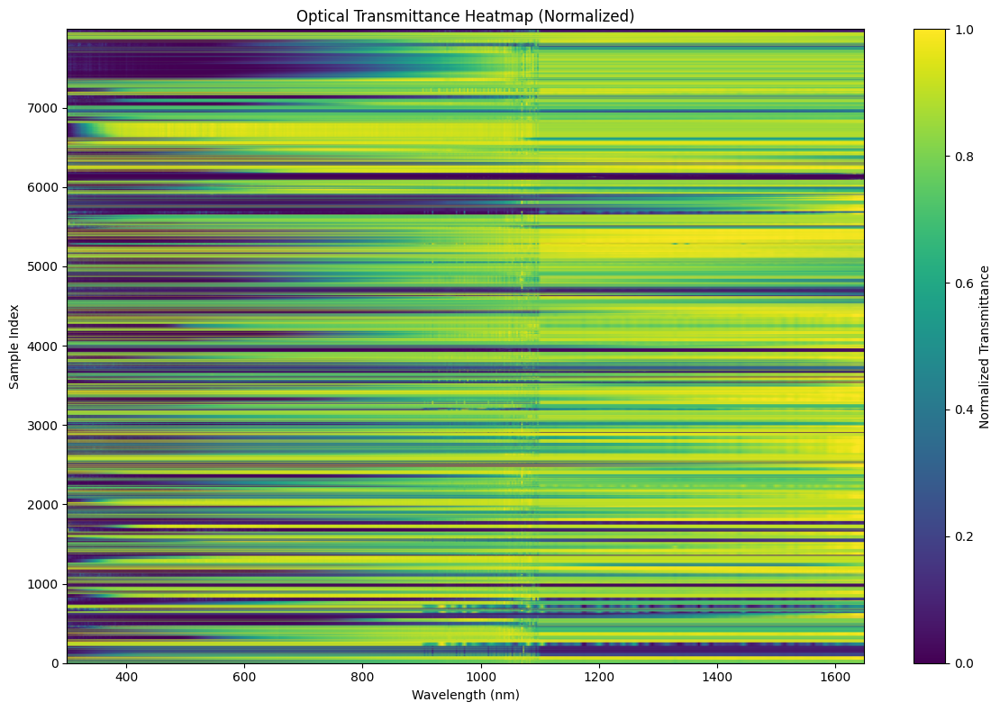

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Filter out rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
]

# Ensure there are valid rows to plot
if not valid_data.empty:
    # Initialize lists to store heatmap data
    wavelength_grid = []
    transmittance_grid = []
    
    # Loop through the valid data to prepare the heatmap
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            wavelength_grid.append(wavelengths)
            transmittance_grid.append(transmittances)
    
    # Create a uniform wavelength grid for the heatmap
    common_wavelengths = np.linspace(min(np.min(w) for w in wavelength_grid),
                                     max(np.max(w) for w in wavelength_grid),
                                     500)  # Set the resolution of the wavelength grid
    
    # Interpolate transmittance data to match the common wavelength grid
    interpolated_transmittance = []
    for wavelengths, transmittances in zip(wavelength_grid, transmittance_grid):
        interpolated_transmittance.append(
            np.interp(common_wavelengths, wavelengths, transmittances)
        )
    
    # Convert to a numpy array for plotting
    heatmap_data = np.array(interpolated_transmittance)
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap_data, aspect='auto', extent=[common_wavelengths[0], common_wavelengths[-1], 0, len(heatmap_data)],
               cmap='viridis', origin='lower')
    plt.colorbar(label='Normalized Transmittance')
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Sample Index')
    plt.title('Optical Transmittance Heatmap (Normalized)')
    plt.tight_layout()
    plt.show()
else:
    print("No valid optical data to plot.")


# Preparing optical data for analysis

### Optical Transmittance Scatter Plots

This code visualizes normalized optical transmittance data for up to 20 samples:

1. **Data Preparation**:
   - Filters and normalizes transmittance data for valid samples.

2. **Visualization**:
   - Creates scatter plots of transmittance vs. wavelength for each sample in a grid layout.

This provides a detailed view of transmittance trends across individual samples.


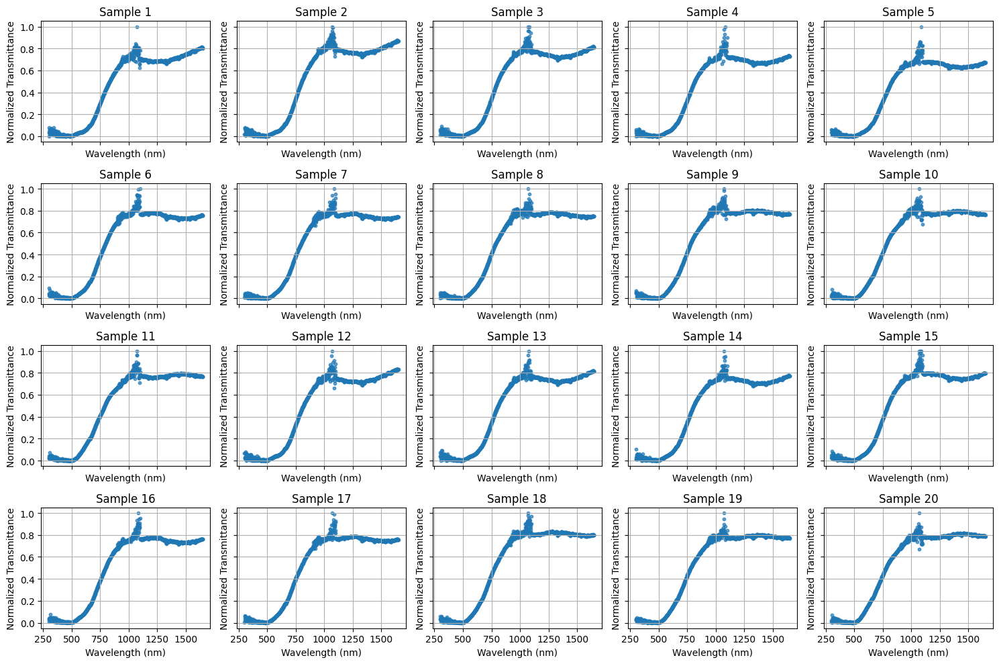

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Filter out rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
]

# Ensure there are valid rows to plot
if not valid_data.empty:
    # Initialize lists to store data
    wavelength_grid = []
    transmittance_grid = []
    
    # Loop through the valid data to prepare the data
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            wavelength_grid.append(wavelengths)
            transmittance_grid.append(transmittances)
    
    # Select 20 samples for visualization
    num_samples = 20
    samples_to_plot = min(num_samples, len(wavelength_grid))
    
    # Create a grid of plots
    fig, axes = plt.subplots(4, 5, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.ravel()  # Flatten axes for easy iteration

    for i in range(samples_to_plot):
        ax = axes[i]
        ax.scatter(wavelength_grid[i], transmittance_grid[i], s=10, alpha=0.7, label=f'Sample {i+1}')
        ax.set_title(f'Sample {i+1}')
        ax.set_xlabel('Wavelength (nm)')
        ax.set_ylabel('Normalized Transmittance')
        ax.grid(True)

    # Hide any unused subplots
    for i in range(samples_to_plot, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No valid optical data to plot.")


In [22]:
### Update clustering below to use dbi metric to identify ideal number of clusters

# Clustering Optical Transmittance Data


This code clusters optical transmittance data to identify representative samples from the dataset. Here's why this approach is valuable:

1. **Data Standardization**:
   - Ensures consistent comparison by interpolating transmittance data onto a common wavelength grid and scaling it for clustering.

2. **Clustering with KMeans**:
   - Groups similar transmittance profiles into 20 clusters, allowing patterns and trends in the data to emerge.

3. **Representative Samples**:
   - Selects one representative sample from each cluster, reducing the dataset while retaining diversity.

4. **Visualization**:
   - Scatter plots of representative transmittance profiles provide a concise overview of the key trends across clusters.

5. **Output**:
   - Provides a DataFrame of representative samples for further analysis.

This approach simplifies large datasets by focusing on diverse, representative samples, making it easier to analyze and interpret optical transmittance trends.


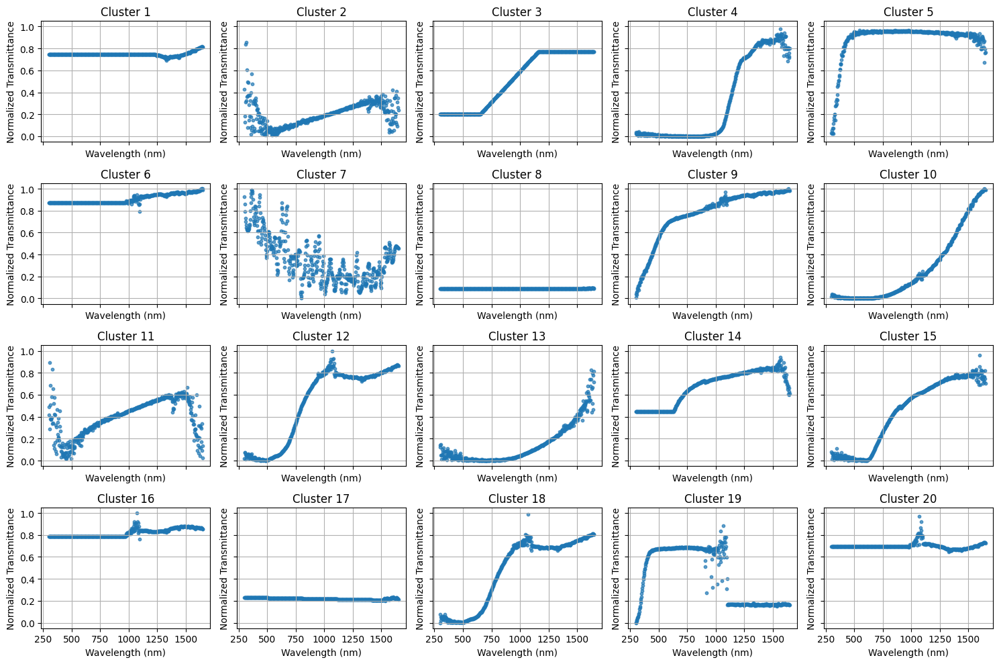

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Filter out rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
].copy()

# Ensure there are valid rows to process
if not valid_data.empty:
    # Initialize lists to store data
    feature_matrix = []
    original_indices = []

    # Loop through the valid data to prepare the data
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            
            # Interpolate transmittances to a common wavelength grid
            common_wavelengths = np.linspace(min(wavelengths), max(wavelengths), 500)
            interpolated_transmittances = np.interp(common_wavelengths, wavelengths, transmittances)
            
            feature_matrix.append(interpolated_transmittances)
            original_indices.append(idx)

    # Convert the feature matrix to a numpy array
    feature_matrix = np.array(feature_matrix)

    # Standardize the feature matrix for clustering
    scaler = StandardScaler()
    feature_matrix_scaled = scaler.fit_transform(feature_matrix)

    # Perform KMeans clustering to identify 20 categories
    n_clusters = 20
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(feature_matrix_scaled)

    # Add cluster labels to valid_data
    valid_data['cluster'] = -1
    for idx, cluster_label in zip(original_indices, cluster_labels):
        valid_data.at[idx, 'cluster'] = cluster_label

    # Select one sample from each cluster
    representative_samples = []
    representative_indices = []
    for cluster in range(n_clusters):
        cluster_indices = np.where(cluster_labels == cluster)[0]
        if len(cluster_indices) > 0:
            representative_indices.append(original_indices[cluster_indices[0]])  # Take the first sample in the cluster
            wavelengths = common_wavelengths
            transmittances = feature_matrix[cluster_indices[0]]
            representative_samples.append((wavelengths, transmittances))

    # Create a DataFrame for representative samples
    representative_samples_df = valid_data.loc[representative_indices].copy()

    # Plot representative samples
    fig, axes = plt.subplots(4, 5, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.ravel()  # Flatten axes for easy iteration

    for i, (wavelengths, transmittances) in enumerate(representative_samples):
        ax = axes[i]
        ax.scatter(wavelengths, transmittances, s=10, alpha=0.7, label=f'Cluster {i+1}')
        ax.set_title(f'Cluster {i+1}')
        ax.set_xlabel('Wavelength (nm)')
        ax.set_ylabel('Normalized Transmittance')
        ax.grid(True)

    # Hide any unused subplots
    for i in range(len(representative_samples), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("No valid optical data to process.")


## VAT Analysis

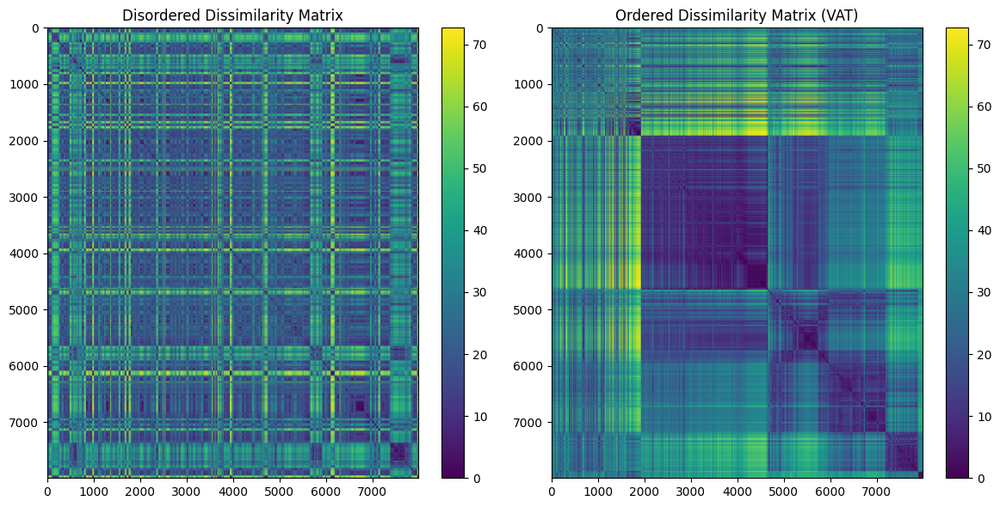

In [10]:
import scipy.spatial.distance as ssd
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import numpy as np

# Compute the pairwise Euclidean distance matrix
if feature_matrix_scaled.shape[0] > 1:  # Ensure there's enough data to compute distances
    distance_matrix = ssd.pdist(feature_matrix_scaled, metric='euclidean')
    square_distance_matrix = ssd.squareform(distance_matrix)

    # Plot the disordered (original) dissimilarity matrix
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    im1 = axes[0].imshow(square_distance_matrix, cmap='viridis', aspect='auto')
    axes[0].set_title("Disordered Dissimilarity Matrix")
    plt.colorbar(im1, ax=axes[0])

    # Apply VAT algorithm (ordering by hierarchical clustering)
    linkage_matrix = sch.linkage(distance_matrix, method='single')
    ordered_indices = sch.leaves_list(linkage_matrix)
    ordered_distance_matrix = square_distance_matrix[ordered_indices, :][:, ordered_indices]

    # Plot the ordered dissimilarity matrix
    im2 = axes[1].imshow(ordered_distance_matrix, cmap='viridis', aspect='auto')
    axes[1].set_title("Ordered Dissimilarity Matrix (VAT)")
    plt.colorbar(im2, ax=axes[1])

    plt.tight_layout()
    plt.show()

else:
    print("Not enough data points for VAT analysis.")


## iVAT Analysis

iVAT Reordering: 100%|████████████████████████████████████████████████████████| 7989/7989 [00:00<00:00, 37047.40step/s]


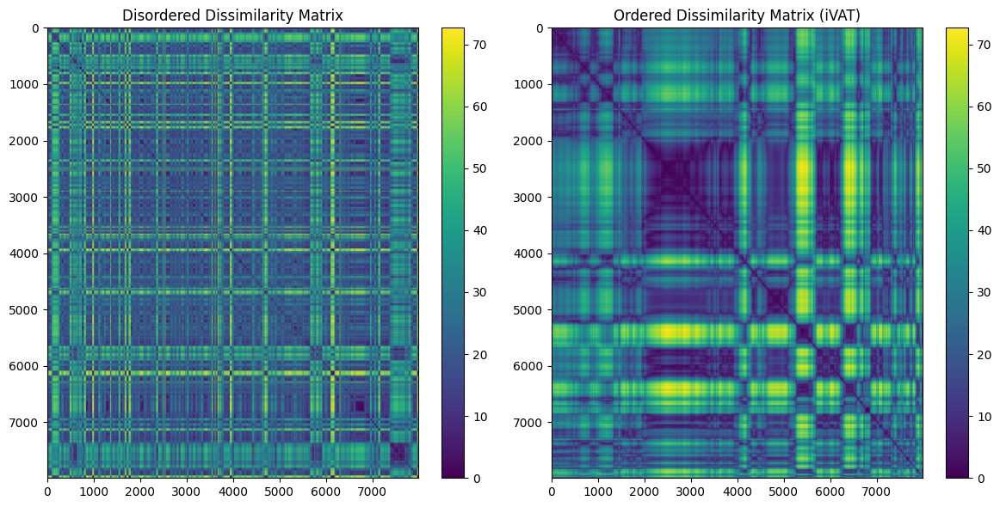

In [11]:
import scipy.spatial.distance as ssd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm  # Import tqdm for the loading bar

# ------------------------------ iVAT Reordering Function with Progress Bar ------------------------------
def ivat_reorder(distance_matrix):
    """
    Reorders a given distance matrix using the iVAT algorithm.
    
    Parameters:
    - distance_matrix (2D array): Square distance matrix.
    
    Returns:
    - ivat_matrix (2D array): Reordered distance matrix.
    - reorder (list): The reordering of indices applied.
    """
    n = distance_matrix.shape[0]
    reorder = [0]  # Start with the first data point
    remaining = np.setdiff1d(np.arange(n), reorder)  # All remaining points

    # Set up the progress bar for (n-1) steps
    with tqdm(total=n-1, desc="iVAT Reordering", unit="step") as pbar:
        while remaining.size > 0:
            last = reorder[-1]
            nearest_idx = np.argmin(distance_matrix[last, remaining])
            reorder.append(remaining[nearest_idx])
            remaining = np.delete(remaining, nearest_idx)
            pbar.update(1)  # Update progress bar after each step

    return distance_matrix[np.ix_(reorder, reorder)], reorder

# Compute the pairwise Euclidean distance matrix
if feature_matrix_scaled.shape[0] > 1:  # Ensure there's enough data to compute distances
    # Compute the condensed distance matrix and then convert it to a square form
    distance_matrix = ssd.pdist(feature_matrix_scaled, metric='euclidean')
    square_distance_matrix = ssd.squareform(distance_matrix)

    # Plot the disordered (original) dissimilarity matrix
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    im1 = axes[0].imshow(square_distance_matrix, cmap='viridis', aspect='auto')
    axes[0].set_title("Disordered Dissimilarity Matrix")
    plt.colorbar(im1, ax=axes[0])

    # Apply the iVAT reordering algorithm with a loading bar
    ivat_distance_matrix, reorder = ivat_reorder(square_distance_matrix)

    # Plot the ordered dissimilarity matrix using iVAT
    im2 = axes[1].imshow(ivat_distance_matrix, cmap='viridis', aspect='auto')
    axes[1].set_title("Ordered Dissimilarity Matrix (iVAT)")
    plt.colorbar(im2, ax=axes[1])

    plt.tight_layout()
    plt.show()

else:
    print("Not enough data points for VAT analysis.")


## Representative examples of optical data clusters

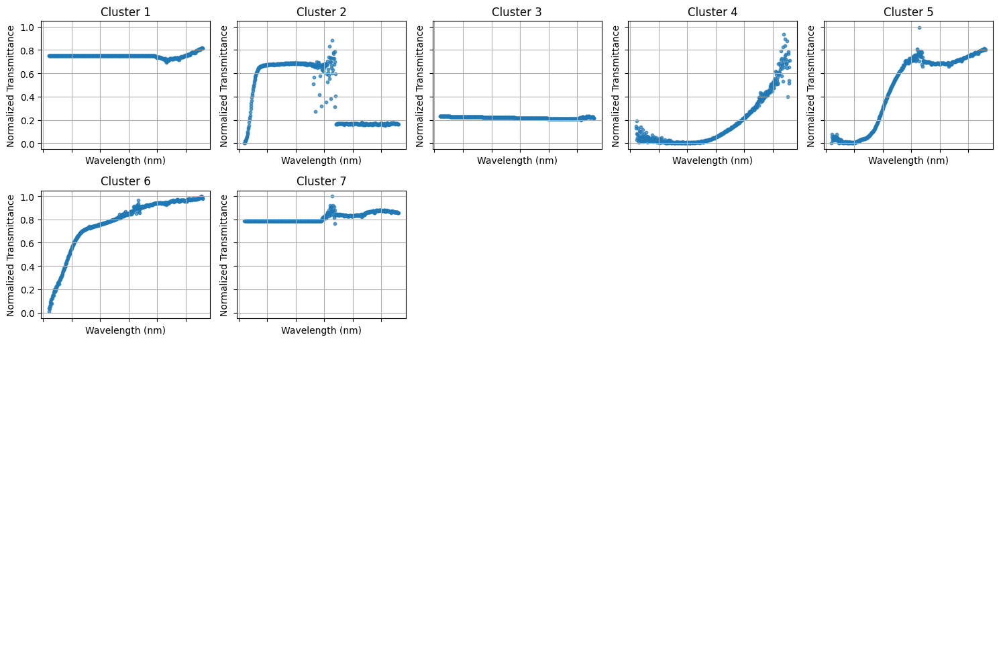

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Filter out rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
].copy()

# Ensure there are valid rows to process
if not valid_data.empty:
    # Initialize lists to store data
    feature_matrix = []
    original_indices = []

    # Loop through the valid data to prepare the data
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            
            # Interpolate transmittances to a common wavelength grid
            common_wavelengths = np.linspace(min(wavelengths), max(wavelengths), 500)
            interpolated_transmittances = np.interp(common_wavelengths, wavelengths, transmittances)
            
            feature_matrix.append(interpolated_transmittances)
            original_indices.append(idx)

    # Convert the feature matrix to a numpy array
    feature_matrix = np.array(feature_matrix)

    # Standardize the feature matrix for clustering
    scaler = StandardScaler()
    feature_matrix_scaled = scaler.fit_transform(feature_matrix)

    # Perform KMeans clustering to identify 20 categories
    n_clusters = 7
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(feature_matrix_scaled)

    # Add cluster labels to valid_data
    valid_data['cluster'] = -1
    for idx, cluster_label in zip(original_indices, cluster_labels):
        valid_data.at[idx, 'cluster'] = cluster_label

    # Select one sample from each cluster
    representative_samples = []
    representative_indices = []
    for cluster in range(n_clusters):
        cluster_indices = np.where(cluster_labels == cluster)[0]
        if len(cluster_indices) > 0:
            representative_indices.append(original_indices[cluster_indices[0]])  # Take the first sample in the cluster
            wavelengths = common_wavelengths
            transmittances = feature_matrix[cluster_indices[0]]
            representative_samples.append((wavelengths, transmittances))

    # Create a DataFrame for representative samples
    representative_samples_df = valid_data.loc[representative_indices].copy()

    # Plot representative samples
    fig, axes = plt.subplots(4, 5, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.ravel()  # Flatten axes for easy iteration

    for i, (wavelengths, transmittances) in enumerate(representative_samples):
        ax = axes[i]
        ax.scatter(wavelengths, transmittances, s=10, alpha=0.7, label=f'Cluster {i+1}')
        ax.set_title(f'Cluster {i+1}')
        ax.set_xlabel('Wavelength (nm)')
        ax.set_ylabel('Normalized Transmittance')
        ax.grid(True)

    # Hide any unused subplots
    for i in range(len(representative_samples), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("No valid optical data to process.")


In [13]:
# Isolate rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
].copy()

# Cleansing Optical Transmittance Data

This code visualizes normalized optical transmittance data:

1. **Preparation**: Filters valid data and normalizes transmittance to [0, 1].
2. **Interpolation**: Aligns transmittance data to a uniform wavelength grid.
3. **Heatmap**: Plots a 2D heatmap with wavelengths (x-axis), sample indices (y-axis), and transmittance intensity (color scale).
4. **Visualization**: Adds labels, a color bar, and a title to highlight patterns.

Displays a message if no valid data is available.


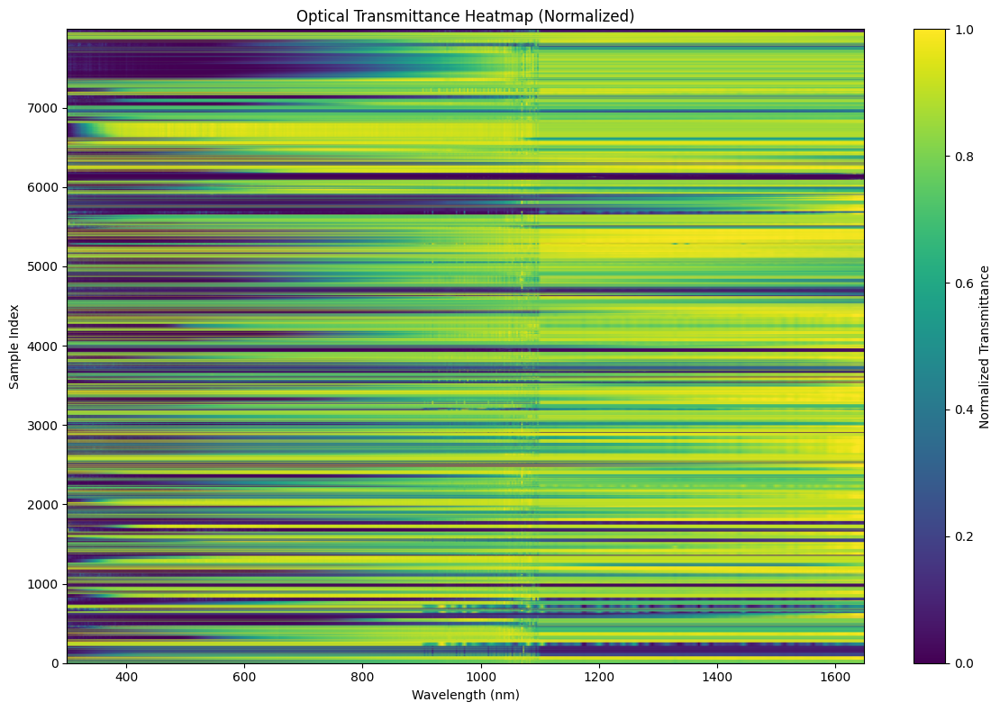

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure there are valid rows to plot
if not valid_data.empty:
    # Initialize lists to store heatmap data
    wavelength_grid = []
    transmittance_grid = []
    
    # Loop through the valid data to prepare the heatmap
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            wavelength_grid.append(wavelengths)
            transmittance_grid.append(transmittances)
    
    # Create a uniform wavelength grid for the heatmap
    common_wavelengths = np.linspace(min(np.min(w) for w in wavelength_grid),
                                     max(np.max(w) for w in wavelength_grid),
                                     500)  # Set the resolution of the wavelength grid
    
    # Interpolate transmittance data to match the common wavelength grid
    interpolated_transmittance = []
    for wavelengths, transmittances in zip(wavelength_grid, transmittance_grid):
        interpolated_transmittance.append(
            np.interp(common_wavelengths, wavelengths, transmittances)
        )
    
    # Convert to a numpy array for plotting
    heatmap_data = np.array(interpolated_transmittance)
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap_data, aspect='auto', extent=[common_wavelengths[0], common_wavelengths[-1], 0, len(heatmap_data)],
               cmap='viridis', origin='lower')
    plt.colorbar(label='Normalized Transmittance')
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Sample Index')
    plt.title('Optical Transmittance Heatmap (Normalized)')
    plt.tight_layout()
    plt.show()
else:
    print("No valid optical data to plot.")


## Truncated Optical Transmittance Heatmap

This code enhances the heatmap by:

1. **Truncation**: Limits data to wavelengths ≤ 1000 nm, focusing on a relevant spectral range.
2. **Improved Visualization**: Adjusts the wavelength grid to the truncated range for consistent interpolation.

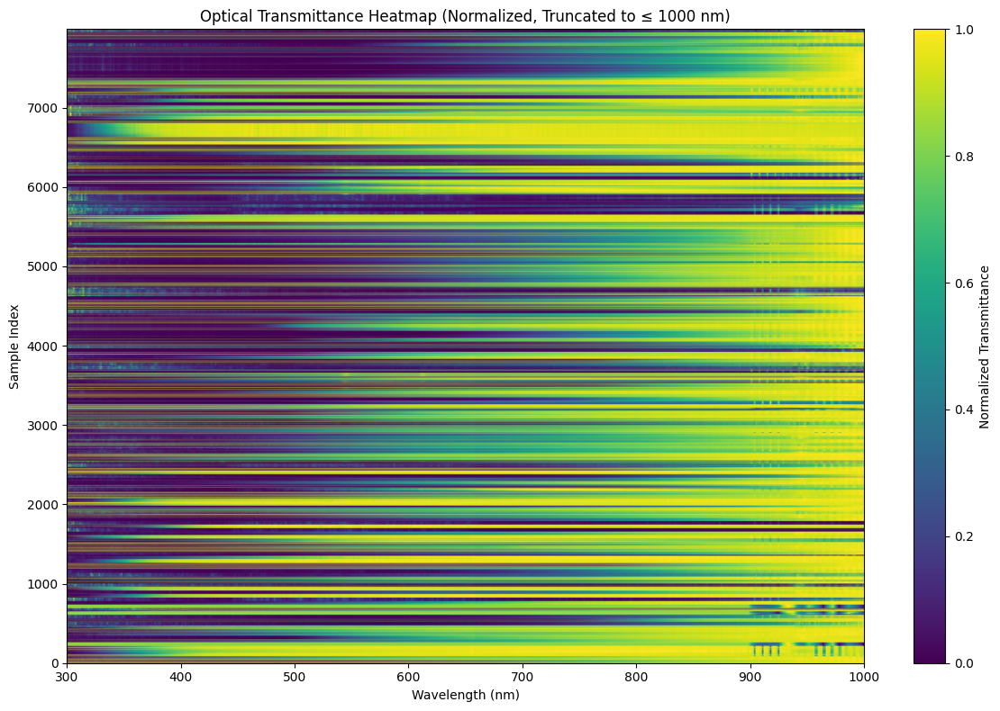

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure there are valid rows to plot
if not valid_data.empty:
    # Initialize lists to store truncated and normalized data
    wavelength_grid = []
    transmittance_grid = []
    
    # Loop through the valid data to prepare the heatmap
    for idx, row in valid_data.iterrows():
        wavelengths = np.array(row['opt_wavelength'])
        transmittances = np.array(row['opt_normalized_transmittance'])
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Truncate data to a maximum wavelength of 1000 nm
            mask = wavelengths <= 1000
            truncated_wavelengths = wavelengths[mask]
            truncated_transmittances = transmittances[mask]
            
            # Normalize transmittance to range [0, 1]
            if len(truncated_transmittances) > 0:
                normalized_transmittances = (truncated_transmittances - np.min(truncated_transmittances)) / \
                                             (np.max(truncated_transmittances) - np.min(truncated_transmittances))
                wavelength_grid.append(truncated_wavelengths)
                transmittance_grid.append(normalized_transmittances)
    
    # Create a uniform wavelength grid for the heatmap
    common_wavelengths = np.linspace(300, 1000, 500)  # Adjust resolution to match truncated range
    
    # Interpolate transmittance data to match the common wavelength grid
    interpolated_transmittance = []
    for wavelengths, transmittances in zip(wavelength_grid, transmittance_grid):
        interpolated_transmittance.append(
            np.interp(common_wavelengths, wavelengths, transmittances)
        )
    
    # Convert to a numpy array for plotting
    heatmap_data = np.array(interpolated_transmittance)
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap_data, aspect='auto', extent=[common_wavelengths[0], common_wavelengths[-1], 0, len(heatmap_data)],
               cmap='viridis', origin='lower')
    plt.colorbar(label='Normalized Transmittance')
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Sample Index')
    plt.title('Optical Transmittance Heatmap (Normalized, Truncated to ≤ 1000 nm)')
    plt.tight_layout()
    plt.show()
else:
    print("No valid optical data to plot.")


## artefacts present in data from 900-1000 nm. Let's truncate to <900 nm.

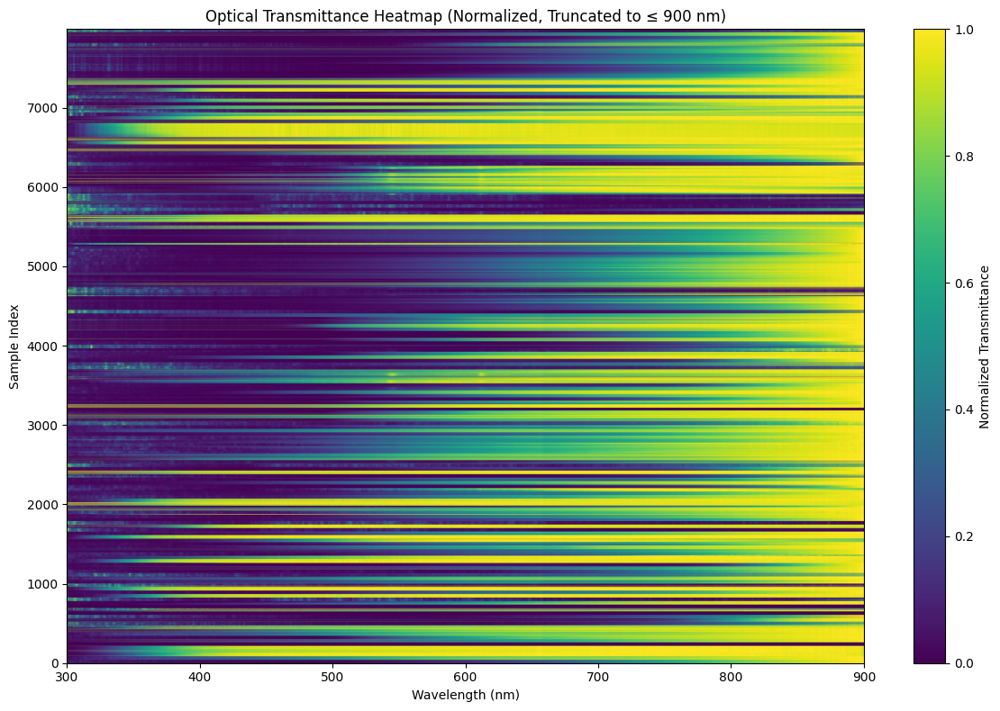

In [17]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure there are valid rows to plot
if not valid_data.empty:
    # Initialize lists to store truncated and normalized data
    wavelength_grid = []
    transmittance_grid = []
    
    # Loop through the valid data to prepare the heatmap
    for idx, row in valid_data.iterrows():
        wavelengths = np.array(row['opt_wavelength'])
        transmittances = np.array(row['opt_normalized_transmittance'])
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Truncate data to a maximum wavelength of 900 nm
            mask = wavelengths <= 900
            truncated_wavelengths = wavelengths[mask]
            truncated_transmittances = transmittances[mask]
            
            # Normalize transmittance to range [0, 1]
            if len(truncated_transmittances) > 0:
                trans_min = np.min(truncated_transmittances)
                trans_max = np.max(truncated_transmittances)
                if trans_max > trans_min:
                    normalized_transmittances = (truncated_transmittances - trans_min) / (trans_max - trans_min)
                else:
                    normalized_transmittances = np.zeros_like(truncated_transmittances)
                
                wavelength_grid.append(truncated_wavelengths)
                transmittance_grid.append(normalized_transmittances)
    
    # Create a uniform wavelength grid for the heatmap
    common_wavelengths = np.linspace(300, 900, 500)  # Adjust resolution to match truncated range
    
    # Interpolate transmittance data to match the common wavelength grid
    interpolated_transmittance = []
    for wavelengths, transmittances in zip(wavelength_grid, transmittance_grid):
        interpolated_transmittance.append(
            np.interp(common_wavelengths, wavelengths, transmittances)
        )
    
    # Convert to a numpy array for plotting
    heatmap_data = np.array(interpolated_transmittance)
    
    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(heatmap_data, aspect='auto', extent=[common_wavelengths[0], common_wavelengths[-1], 0, len(heatmap_data)],
               cmap='viridis', origin='lower')
    plt.colorbar(label='Normalized Transmittance')
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Sample Index')
    plt.title('Optical Transmittance Heatmap (Normalized, Truncated to ≤ 900 nm)')
    plt.tight_layout()
    plt.show()
else:
    print("No valid optical data to plot.")


## Reanalyze clusters after truncating and normalizing

iVAT Reordering: 100%|████████████████████████████████████████████████████████| 7989/7989 [00:00<00:00, 47096.67step/s]


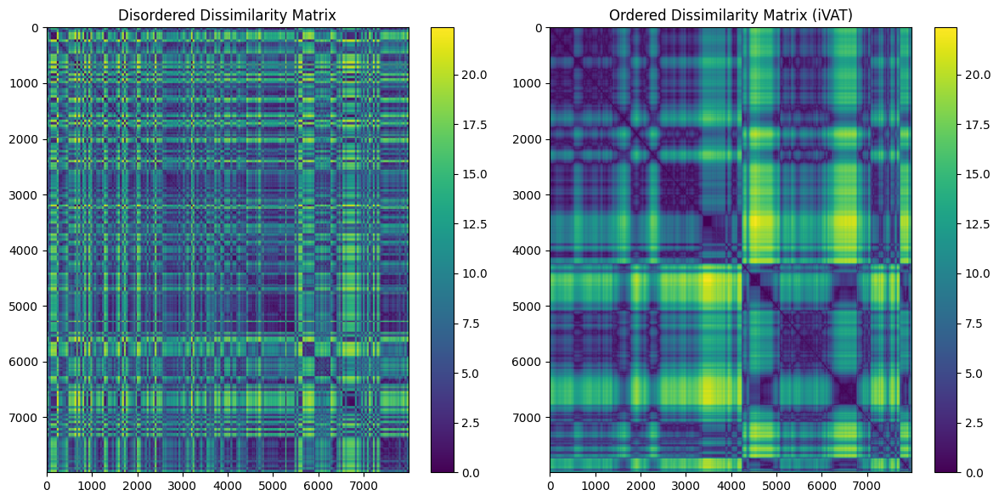

In [18]:
import scipy.spatial.distance as ssd
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm  # Import tqdm for the loading bar

# ------------------------------ iVAT Reordering Function with Progress Bar ------------------------------
def ivat_reorder(distance_matrix):
    """
    Reorders a given distance matrix using the iVAT algorithm.
    
    Parameters:
      - distance_matrix (2D array): Square distance matrix.
    
    Returns:
      - ivat_matrix (2D array): Reordered distance matrix.
      - reorder (list): The reordering of indices applied.
    """
    n = distance_matrix.shape[0]
    reorder = [0]  # Start with the first data point
    remaining = np.setdiff1d(np.arange(n), reorder)  # All remaining points

    # Set up the progress bar for (n-1) steps
    with tqdm(total=n-1, desc="iVAT Reordering", unit="step") as pbar:
        while remaining.size > 0:
            last = reorder[-1]
            nearest_idx = np.argmin(distance_matrix[last, remaining])
            reorder.append(remaining[nearest_idx])
            remaining = np.delete(remaining, nearest_idx)
            pbar.update(1)  # Update progress bar after each step

    return distance_matrix[np.ix_(reorder, reorder)], reorder

# Now, using the truncated and normalized data from your heatmap code:
if heatmap_data.shape[0] > 1:  # Ensure there are enough samples
    # Compute the pairwise Euclidean distance matrix from the heatmap data
    distance_matrix = ssd.pdist(heatmap_data, metric='euclidean')
    square_distance_matrix = ssd.squareform(distance_matrix)

    # Plot the disordered (original) dissimilarity matrix
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    im1 = axes[0].imshow(square_distance_matrix, cmap='viridis', aspect='auto')
    axes[0].set_title("Disordered Dissimilarity Matrix")
    plt.colorbar(im1, ax=axes[0])

    # Apply the iVAT reordering algorithm with a loading bar
    ivat_distance_matrix, reorder = ivat_reorder(square_distance_matrix)

    # Plot the ordered dissimilarity matrix using iVAT
    im2 = axes[1].imshow(ivat_distance_matrix, cmap='viridis', aspect='auto')
    axes[1].set_title("Ordered Dissimilarity Matrix (iVAT)")
    plt.colorbar(im2, ax=axes[1])

    plt.tight_layout()
    plt.show()
else:
    print("Not enough data points for VAT analysis.")


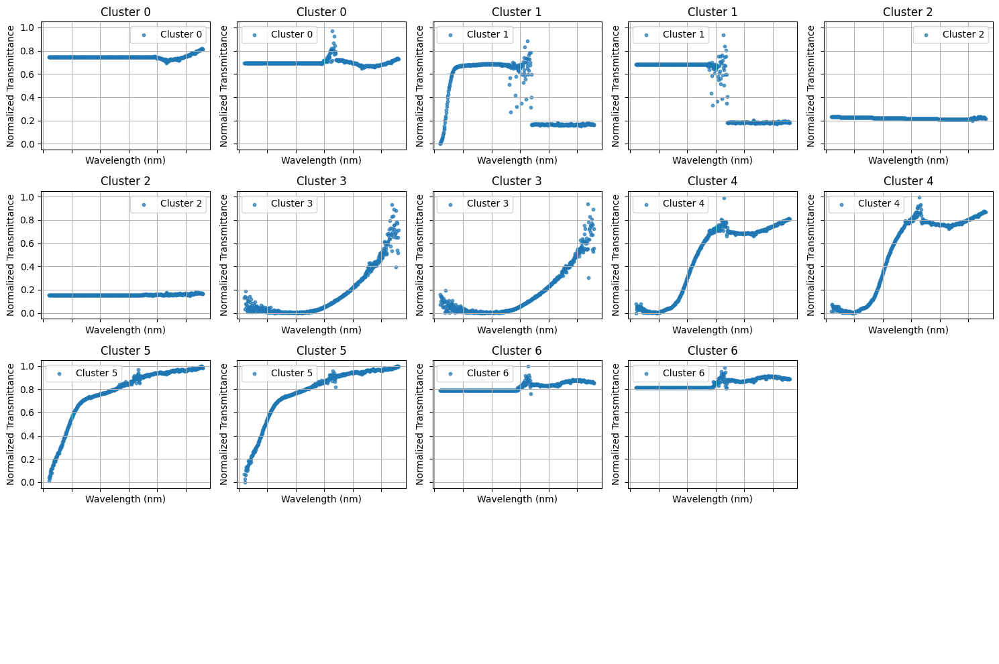

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Filter out rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna()
].copy()

# Ensure there are valid rows to process
if not valid_data.empty:
    # Initialize lists to store data
    feature_matrix = []
    original_indices = []

    # Loop through the valid data to prepare the data
    for idx, row in valid_data.iterrows():
        wavelengths = row['opt_wavelength']
        transmittances = row['opt_normalized_transmittance']
        
        # Skip if data lengths do not match or are empty
        if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
            # Normalize transmittance to range [0, 1]
            transmittances = (transmittances - np.min(transmittances)) / (np.max(transmittances) - np.min(transmittances))
            
            # Interpolate transmittances to a common wavelength grid
            common_wavelengths = np.linspace(min(wavelengths), max(wavelengths), 500)
            interpolated_transmittances = np.interp(common_wavelengths, wavelengths, transmittances)
            
            feature_matrix.append(interpolated_transmittances)
            original_indices.append(idx)

    # Convert the feature matrix to a numpy array
    feature_matrix = np.array(feature_matrix)

    # Standardize the feature matrix for clustering
    scaler = StandardScaler()
    feature_matrix_scaled = scaler.fit_transform(feature_matrix)

    # Perform KMeans clustering to identify 7 clusters
    n_clusters = 7
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(feature_matrix_scaled)

    # Add cluster labels to valid_data
    valid_data['cluster'] = -1
    for idx, cluster_label in zip(original_indices, cluster_labels):
        valid_data.at[idx, 'cluster'] = cluster_label

    # Select two samples from each cluster
    representative_samples = []
    representative_indices = []
    for cluster in range(n_clusters):
        cluster_indices = np.where(cluster_labels == cluster)[0]
        if len(cluster_indices) >= 2:
            # Take the first two samples in the cluster
            for j in range(2):
                rep_idx = cluster_indices[j]
                representative_indices.append(original_indices[rep_idx])
                representative_samples.append((common_wavelengths, feature_matrix[rep_idx]))
        else:
            # If a cluster has only one sample, include it once.
            if len(cluster_indices) == 1:
                rep_idx = cluster_indices[0]
                representative_indices.append(original_indices[rep_idx])
                representative_samples.append((common_wavelengths, feature_matrix[rep_idx]))

    # Create a DataFrame for representative samples
    representative_samples_df = valid_data.loc[representative_indices].copy()

    # Plot representative samples using a 4 x 5 grid (to allow up to 20 subplots)
    num_samples = len(representative_samples)  # Ideally 14 (2 per cluster for 7 clusters)
    fig, axes = plt.subplots(4, 5, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.ravel()  # Flatten axes for easy iteration

    for i, (wavelengths, transmittances) in enumerate(representative_samples):
        ax = axes[i]
        cluster_label = representative_samples_df.iloc[i]['cluster']
        ax.scatter(wavelengths, transmittances, s=10, alpha=0.7, label=f'Cluster {cluster_label}')
        ax.set_title(f'Cluster {cluster_label}')
        ax.set_xlabel('Wavelength (nm)')
        ax.set_ylabel('Normalized Transmittance')
        ax.grid(True)
        ax.legend()

    # Hide any unused subplots
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("No valid optical data to process.")


In [22]:
# Filter out rows with valid data
valid_data = representative_samples_df[
    representative_samples_df['opt_wavelength'].notna() &
    representative_samples_df['opt_normalized_transmittance'].notna() &
    representative_samples_df['thickness'].notna()
].copy()

# Tauc Plot Analysis for Bandgap Estimation

This code estimates bandgaps from optical transmittance data by:
1. Converting wavelengths to photon energy (eV).
2. Calculating \((\alpha h\nu)^2\) from transmittance.
3. Using Tauc plots and linear fits to estimate bandgaps.
4. Plotting up to 20 samples with bandgap values and fits.
5. Calculating the average bandgap across samples.

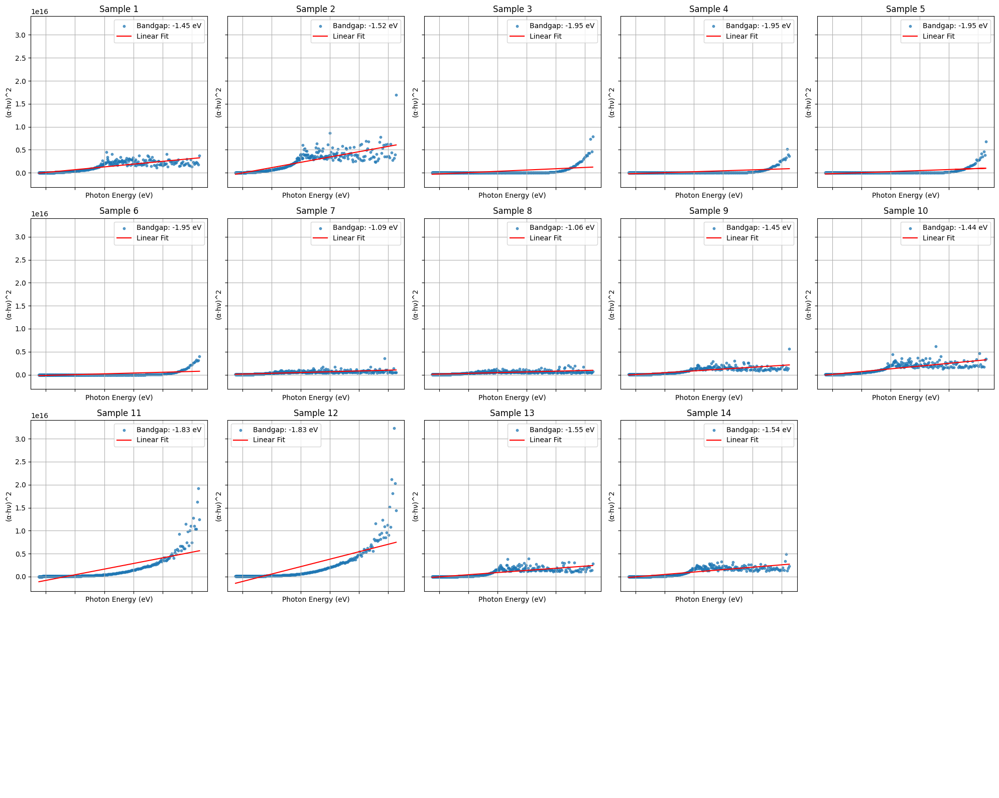

Average Bandgap (Direct): -1.61 eV


In [23]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# ------------------------------ Tauc Analysis Function ------------------------------
def tauc_analysis(wavelengths, transmittances, thickness):
    """
    Performs Tauc analysis.
    
    Parameters:
      wavelengths (array): Wavelengths in nm.
      transmittances (array): Normalized transmittance values.
      thickness (float): Sample thickness (in μm) as provided in valid_data.
    
    Returns:
      bandgap (float): Estimated bandgap (eV) from the linear fit x-intercept.
      energy (array): Photon energies (eV) corresponding to wavelengths.
      alpha_hnu_2 (array): (α·hν)² values.
    """
    # Convert wavelength (nm) to energy (eV): E = hc/λ
    h = 6.62607015e-34  # Planck's constant in J·s
    c = 3e8             # Speed of light in m/s
    eV_conversion = 1.60218e-19  # Joules to eV conversion factor
    energy = (h * c) / (wavelengths * 1e-9)  # Energy in Joules
    energy = energy / eV_conversion         # Energy in eV

    # Convert thickness from μm to m and calculate absorption coefficient (α)
    thickness_m = thickness * 1e-6  
    alpha = -np.log(transmittances) / thickness_m

    # Calculate (α * hν)^2 for Tauc plot
    alpha_hnu_2 = (alpha * energy)**2
    
    # Perform linear regression fit
    slope, intercept, r_value, p_value, std_err = stats.linregress(energy, alpha_hnu_2)

    # Estimate the bandgap from the x-intercept of the linear fit
    bandgap = intercept / slope

    return bandgap, energy, alpha_hnu_2

# ------------------------------ Tauc Plot for 14 Representative Samples ------------------------------
# 'valid_data' here is assumed to be the representative_samples_df produced earlier (14 examples)
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.ravel()  # Flatten the array for easy iteration

bandgaps = []
for idx, (row, ax) in enumerate(zip(valid_data.iterrows(), axes)):
    row = row[1]  # Extract the actual row data
    wavelengths = np.array(row['opt_wavelength'])
    transmittances = np.array(row['opt_normalized_transmittance'])
    thickness = row['thickness']  # Sample thickness (in μm)
    
    # Skip if data lengths do not match or are empty
    if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
        # Truncate data to a maximum wavelength of 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]
        
        try:
            # Perform Tauc analysis using the thickness from valid_data
            bandgap, energy, alpha_hnu_2 = tauc_analysis(truncated_wavelengths, truncated_transmittances, thickness)
            bandgaps.append(bandgap)
            
            # Plot in the corresponding subplot
            ax.scatter(energy, alpha_hnu_2, s=10, alpha=0.7, label=f'Bandgap: {bandgap:.2f} eV')
            # Compute and plot the linear fit line
            p = np.polyfit(energy, alpha_hnu_2, 1)
            fit_line = np.polyval(p, energy)
            ax.plot(energy, fit_line, label='Linear Fit', color='red')
            ax.set_title(f'Sample {idx + 1}')
            ax.set_xlabel('Photon Energy (eV)')
            ax.set_ylabel('(α·hν)^2')
            ax.legend()
            ax.grid(True)
        except Exception as e:
            ax.text(0.5, 0.5, 'Error in processing', ha='center', va='center', transform=ax.transAxes)

# Hide any unused subplots
for i in range(len(valid_data), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Calculate and print the average bandgap (if needed)
avg_bandgap = np.nanmean(bandgaps)
print(f'Average Bandgap (Direct): {avg_bandgap:.2f} eV')


## Include thickness in calculation

This updated code enhances bandgap estimation by incorporating **sample-specific thickness** data to calculate the absorption coefficient $(\alpha)$ accurately.



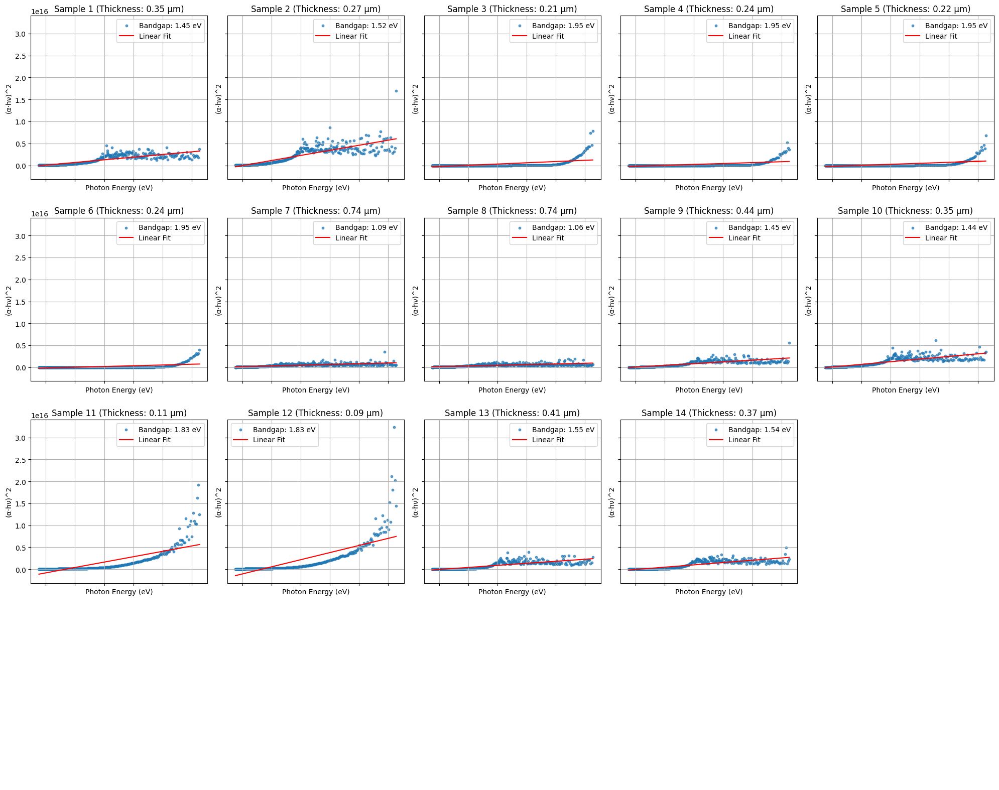

Average Bandgap (Direct): 1.61 eV


In [24]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# ------------------------------ Tauc Analysis Function ------------------------------
def tauc_analysis(wavelengths, transmittances, thickness_um):
    """
    Performs Tauc analysis.
    
    Parameters:
      wavelengths (array): Wavelengths in nm.
      transmittances (array): Normalized transmittance values.
      thickness_um (float): Sample thickness in μm.
    
    Returns:
      bandgap (float): Estimated bandgap (eV) from the linear fit x-intercept.
      energy (array): Photon energies (eV) corresponding to wavelengths.
      alpha_hnu_2 (array): (α·hν)^2 values.
    """
    # Convert wavelength (nm) to energy (eV): E = hc/λ
    h = 6.62607015e-34  # Planck's constant in J·s
    c = 3e8             # Speed of light in m/s
    eV_conversion = 1.60218e-19  # Joules to eV conversion factor
    energy = (h * c) / (wavelengths * 1e-9)  # Energy in Joules
    energy = energy / eV_conversion         # Energy in eV

    # Convert thickness from μm to m and calculate absorption coefficient (α)
    thickness_m = thickness_um * 1e-6  
    alpha = -np.log(transmittances) / thickness_m

    # Calculate (α * hν)^2 for Tauc plot
    alpha_hnu_2 = (alpha * energy)**2

    # Perform linear regression fit
    slope, intercept, r_value, p_value, std_err = stats.linregress(energy, alpha_hnu_2)

    # Estimate the bandgap from the x-intercept of the fit line
    bandgap = -intercept / slope

    return bandgap, energy, alpha_hnu_2

# ------------------------------ Tauc Plot for 14 Representative Examples ------------------------------
# Here, representative_samples_df is the DataFrame produced from your clustering code,
# containing the 14 examples (2 per cluster for 7 clusters) with columns 'opt_wavelength',
# 'opt_normalized_transmittance', and 'thickness'.
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.ravel()  # Flatten the 2D array for easy iteration

bandgaps = []
# Iterate over the 14 representative examples
for idx, (row, ax) in enumerate(zip(representative_samples_df.iterrows(), axes)):
    row = row[1]  # Extract the row data
    wavelengths = np.array(row['opt_wavelength'])
    transmittances = np.array(row['opt_normalized_transmittance'])
    thickness_um = row['thickness']  # Sample thickness in μm

    # Proceed only if data is non-empty and matching in length
    if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
        # Truncate data to wavelengths ≤ 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]

        try:
            # Perform Tauc analysis using the sample's thickness
            bandgap, energy, alpha_hnu_2 = tauc_analysis(truncated_wavelengths, truncated_transmittances, thickness_um)
            bandgaps.append(bandgap)

            # Plot the Tauc data: scatter and the linear fit line
            ax.scatter(energy, alpha_hnu_2, s=10, alpha=0.7, label=f'Bandgap: {bandgap:.2f} eV')
            p = np.polyfit(energy, alpha_hnu_2, 1)
            fit_line = np.polyval(p, energy)
            ax.plot(energy, fit_line, color='red', label='Linear Fit')
            ax.set_title(f'Sample {idx + 1} (Thickness: {thickness_um:.2f} μm)')
            ax.set_xlabel('Photon Energy (eV)')
            ax.set_ylabel('(α·hν)^2')
            ax.legend()
            ax.grid(True)
        except Exception as e:
            ax.text(0.5, 0.5, 'Error in processing', ha='center', va='center', transform=ax.transAxes)

# Hide any unused subplots (if the grid is larger than 14)
for i in range(len(representative_samples_df), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Calculate and print the average bandgap from these 14 examples
avg_bandgap = np.nanmean(bandgaps)
print(f'Average Bandgap (Direct): {avg_bandgap:.2f} eV')


## Linear Region Optimization


This code refines bandgap estimation by dynamically identifying the optimal linear region for Tauc plots, minimizing error within a sliding 0.5 eV energy window. This ensures more accurate bandgap calculations tailored to each sample's data, improving reliability over a fixed region approach.


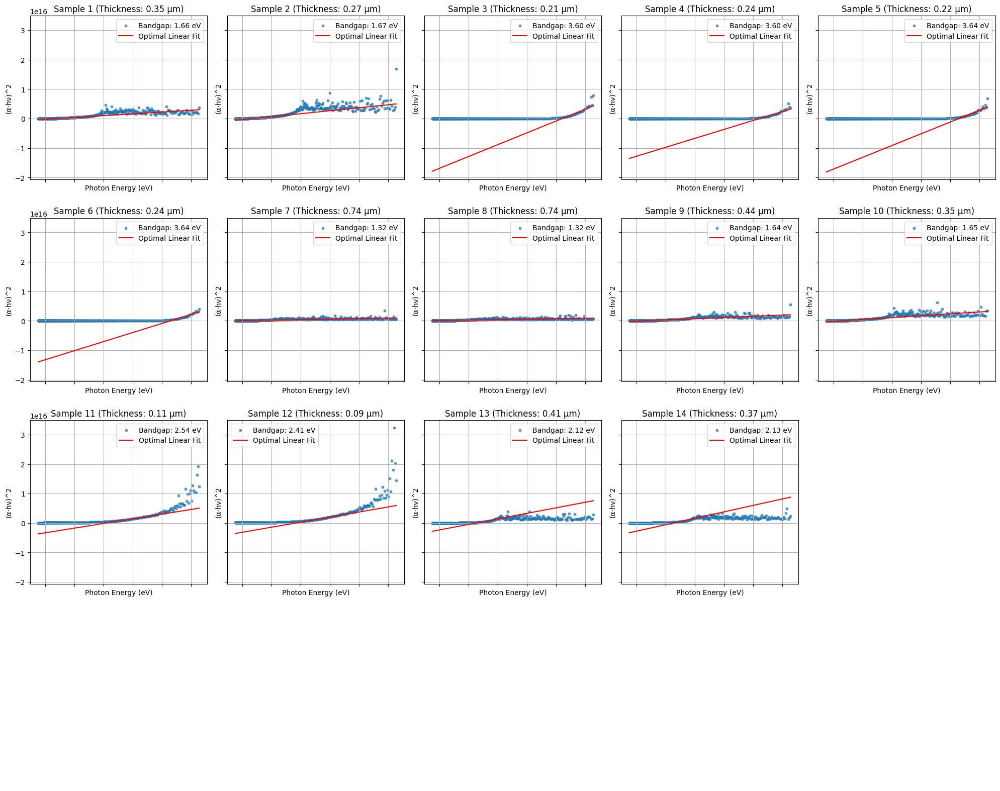

Average Bandgap (Direct): 2.35 eV


In [25]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# ------------------------------ Tauc Analysis Function ------------------------------
def tauc_analysis(wavelengths, transmittances, thickness_um):
    """
    Performs Tauc analysis.
    
    Parameters:
      wavelengths (array): Wavelengths in nm.
      transmittances (array): Normalized transmittance values.
      thickness_um (float): Sample thickness in μm.
    
    Returns:
      bandgap (float): Estimated bandgap (eV) from the linear fit x-intercept.
      energy (array): Photon energies (eV) corresponding to wavelengths.
      alpha_hnu_2 (array): (α·hν)^2 values.
    """
    # Convert wavelength (nm) to energy (eV): E = hc/λ
    h = 6.62607015e-34  # Planck's constant in J·s
    c = 3e8             # Speed of light in m/s
    eV_conversion = 1.60218e-19  # Joules to eV conversion factor
    energy = (h * c) / (wavelengths * 1e-9)  # Energy in Joules
    energy = energy / eV_conversion         # Energy in eV

    # Convert thickness from μm to m and calculate absorption coefficient (α)
    thickness_m = thickness_um * 1e-6  
    alpha = -np.log(transmittances) / thickness_m

    # Calculate (α * hν)^2 for Tauc plot
    alpha_hnu_2 = (alpha * energy)**2

    # Initialize variables for optimal linear region search
    best_slope = None
    best_intercept = None
    best_metric = float('inf')  # Metric = error^2 / slope^5
    best_bandgap = None

    # Define window parameters: 0.3 eV window, moving in 0.1 eV steps
    window_size = 0.5  # Energy range in eV
    step_size = 0.05    # Increment for moving the window

    min_energy = np.min(energy)
    max_energy = np.max(energy)

    # Search all possible windows within the energy range
    for start in np.arange(min_energy, max_energy - window_size, step_size):
        end = start + window_size
        mask = (energy >= start) & (energy <= end)
        if np.sum(mask) >= 2:  # Require at least two points for fitting
            slope, intercept, _, _, _ = stats.linregress(energy[mask], alpha_hnu_2[mask])
            error = np.mean((alpha_hnu_2[mask] - (slope * energy[mask] + intercept))**2)
            if slope > 0:
                metric = error**2 / slope**5
                if metric < best_metric:
                    best_metric = metric
                    best_slope = slope
                    best_intercept = intercept
                    best_bandgap = -intercept / slope  # x-intercept gives bandgap

    return best_bandgap, energy, alpha_hnu_2, best_slope, best_intercept

# ------------------------------ Tauc Plot for 14 Representative Examples ------------------------------
# Here, valid_data is assumed to be the filtered representative_samples_df (14 examples: 2 per cluster)
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.ravel()  # Flatten the grid for easy iteration

bandgaps = []
# Iterate only over the 14 representative examples
for idx, (row, ax) in enumerate(zip(valid_data.iterrows(), axes)):
    row = row[1]  # Extract the row data
    wavelengths = np.array(row['opt_wavelength'])
    transmittances = np.array(row['opt_normalized_transmittance'])
    thickness_um = row['thickness']  # Thickness in μm

    # Only process if data lengths match and are non-empty
    if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
        # Truncate wavelengths to ≤ 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]

        try:
            # Perform Tauc analysis using the sample thickness
            bandgap, energy, alpha_hnu_2, best_slope, best_intercept = tauc_analysis(
                truncated_wavelengths, truncated_transmittances, thickness_um
            )
            bandgaps.append(bandgap)

            # Plot the Tauc data (scatter) and the optimal linear fit line
            ax.scatter(energy, alpha_hnu_2, s=10, alpha=0.7,
                       label=f'Bandgap: {bandgap:.2f} eV')
            if best_slope is not None:
                linear_fit = best_slope * energy + best_intercept
                ax.plot(energy, linear_fit, color='red', label='Optimal Linear Fit')
            ax.set_title(f'Sample {idx + 1} (Thickness: {thickness_um:.2f} μm)')
            ax.set_xlabel('Photon Energy (eV)')
            ax.set_ylabel('(α·hν)^2')
            ax.legend()
            ax.grid(True)
        except Exception as e:
            ax.text(0.5, 0.5, 'Error in processing', ha='center', va='center', transform=ax.transAxes)

# Hide any unused subplots (if the grid has more than 14)
for i in range(len(valid_data), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Calculate and print the average bandgap from these 14 examples
avg_bandgap = np.nanmean(bandgaps)
print(f'Average Bandgap (Direct): {avg_bandgap:.2f} eV')


# Automated analysis of direct and indirect bandgap on the full dataset

In [27]:
#Reload combined_libraries_data_df
import pandas as pd

# Define the path to the Parquet file
input_file = "Filtered_Libraries_Data.parquet"

# Read the Parquet file into a DataFrame
try:
    combined_libraries_data_df = pd.read_parquet(input_file, engine='pyarrow')
    print("Parquet file successfully read into a DataFrame.")
except FileNotFoundError:
    print(f"Error: The file '{input_file}' was not found.")
except Exception as e:
    print(f"An error occurred while reading the Parquet file: {e}")

# Display the first few rows of the DataFrame (optional)
print(combined_libraries_data_df.keys(), len(combined_libraries_data_df))


Parquet file successfully read into a DataFrame.
Index(['id', 'num', 'pdac', 'quality', 'person_id', 'sample_date',
       'owner_name', 'owner_email', 'xrf_type', 'sputter_operator',
       'sample_ids', 'elements', 'xrf_elements', 'xrf_compounds',
       'deposition_sample_time_min', 'deposition_compounds',
       'deposition_power', 'deposition_base_pressure_mtorr',
       'deposition_growth_pressure_mtorr', 'deposition_target_pulses',
       'deposition_rep_rate', 'deposition_energy', 'deposition_cycles',
       'deposition_ts_distance', 'deposition_initial_temp_c', 'box_number',
       'deposition_gases', 'deposition_substrate_material',
       'deposition_gas_flow_sccm', 'has_xrd', 'has_xrf', 'has_ele', 'has_opt',
       'data_access', 'sample_library_id', 'position', 'thickness',
       'xrf_concentration', 'xrd_angle', 'xrd_background', 'xrd_intensity',
       'fpm_voltage_volts', 'fpm_current_amps', 'fpm_sheet_resistance',
       'fpm_standard_deviation', 'fpm_resistivity', 'f

In [28]:
# Isolate rows with valid data
valid_data = combined_libraries_data_df[
    combined_libraries_data_df['opt_wavelength'].notna() &
    combined_libraries_data_df['opt_normalized_transmittance'].notna() &
    combined_libraries_data_df['thickness'].notna()
].copy()

In [98]:
comment this line and run to process direct bandgaps for all samples, takes ~2 minutes
import numpy as np
from scipy.stats import linregress
from tqdm.notebook import tqdm  # For Jupyter Notebook-compatible progress bar

# Function for Tauc Analysis with optimized linear region fitting
def tauc_analysis(wavelengths, transmittances, thickness_um):
    # Convert thickness from micrometers to meters
    thickness_m = thickness_um * 1e-6  # Convert μm to m

    # Convert wavelength (nm) to energy (eV): E = hc/λ
    h = 6.62607015e-34  # Planck's constant in J·s
    c = 3e8  # Speed of light in m/s
    eV_conversion = 1.60218e-19  # Joules to eV
    energy = (h * c) / (wavelengths * 1e-9) / eV_conversion  # Energy in eV

    # Calculate absorption coefficient (α) from transmittance data
    # α = -ln(T) / thickness
    alpha = -np.log(transmittances) / thickness_m

    # Calculate (α * hν)^2 for Tauc plot (direct bandgap)
    alpha_hnu_2 = (alpha * energy) ** 2  # (α*hν)^2

    # Initialize variables for the optimal linear region
    best_slope = None
    best_intercept = None
    best_metric = float('inf')  # Metric = error / abs(slope)
    best_bandgap = None

    # Define the window size and step size
    window_size = 0.5  # Energy range in eV
    step_size = 0.1  # Increment for moving the window

    # Search all possible 0.5 eV-wide windows
    min_energy = np.min(energy)
    max_energy = np.max(energy)

    for start in np.arange(min_energy, max_energy - window_size, step_size):
        end = start + window_size
        mask = (energy >= start) & (energy <= end)
        if np.sum(mask) >= 2:  # At least 2 points required for fitting
            slope, intercept, _, _, _ = linregress(energy[mask], alpha_hnu_2[mask])
            error = np.mean((alpha_hnu_2[mask] - (slope * energy[mask] + intercept)) ** 2)
            if slope > 0:
                metric = error**2 / slope**(5)
                if metric < best_metric:
                    best_metric = metric
                    best_slope = slope
                    best_intercept = intercept
                    best_bandgap = -intercept / slope  # Bandgap from x-intercept

    return best_bandgap

# Initialize a new column for calculated bandgap
valid_data['calc_tauc_direct_bandgap_eV'] = np.nan

# Prepare data for Tauc analysis
for idx, row in tqdm(valid_data.iterrows(), total=len(valid_data), desc="Processing Samples"):
    wavelengths = np.array(row['opt_wavelength'])
    transmittances = np.array(row['opt_normalized_transmittance'])
    thickness_um = row['thickness']  # Sample thickness in μm

    # Skip if data lengths do not match or are empty
    if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
        # Truncate data to a maximum wavelength of 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]

        try:
            # Perform Tauc analysis
            bandgap = tauc_analysis(truncated_wavelengths, truncated_transmittances, thickness_um)
            valid_data.at[idx, 'calc_tauc_direct_bandgap_eV'] = bandgap
        except Exception as e:
            print(f"Error processing sample {idx}: {e}")

# Display summary of bandgap results
print(valid_data[['calc_tauc_direct_bandgap_eV']].describe())


SyntaxError: invalid syntax (2492754777.py, line 1)

## While we're at it, let's also calculate the indirect bandgap

In [99]:
comment this line and run to process indirect bandgaps for all samples, takes ~2 minutes
import numpy as np
from scipy.stats import linregress
from tqdm.notebook import tqdm  # For Jupyter Notebook-compatible progress bar

# Function for Tauc Analysis with optimized linear region fitting
def tauc_analysis(wavelengths, transmittances, thickness_um):
    # Convert thickness from micrometers to meters
    thickness_m = thickness_um * 1e-6  # Convert μm to m

    # Convert wavelength (nm) to energy (eV): E = hc/λ
    h = 6.62607015e-34  # Planck's constant in J·s
    c = 3e8  # Speed of light in m/s
    eV_conversion = 1.60218e-19  # Joules to eV
    energy = (h * c) / (wavelengths * 1e-9) / eV_conversion  # Energy in eV

    # Calculate absorption coefficient (α) from transmittance data
    # α = -ln(T) / thickness
    alpha = -np.log(transmittances) / thickness_m

    # Calculate (α * hν)^1/2 for Tauc plot (indirect bandgap)
    alpha_hnu_1_2 = np.sqrt(alpha * energy)  # (α*hν)^1/2

    # Initialize variables for the optimal linear region
    best_slope = None
    best_intercept = None
    best_metric = float('inf')  # Metric = error / abs(slope)
    best_bandgap = None

    # Define the window size and step size
    window_size = 0.5  # Energy range in eV
    step_size = 0.1  # Increment for moving the window

    # Search all possible 0.5 eV-wide windows
    min_energy = np.min(energy)
    max_energy = np.max(energy)

    for start in np.arange(min_energy, max_energy - window_size, step_size):
        end = start + window_size
        mask = (energy >= start) & (energy <= end)
        if np.sum(mask) >= 2:  # At least 2 points required for fitting
            slope, intercept, _, _, _ = linregress(energy[mask], alpha_hnu_1_2[mask])
            error = np.mean((alpha_hnu_1_2[mask] - (slope * energy[mask] + intercept)) ** 2)
            if slope > 0:
                metric = error**2 / slope**(5)
                if metric < best_metric:
                    best_metric = metric
                    best_slope = slope
                    best_intercept = intercept
                    best_bandgap = -intercept / slope  # Bandgap from x-intercept

    return best_bandgap

# Initialize a new column for calculated bandgap
valid_data['calc_tauc_indirect_bandgap_eV'] = np.nan

# Prepare data for Tauc analysis with progress bar
for idx, row in tqdm(valid_data.iterrows(), total=len(valid_data), desc="Processing Samples"):
    wavelengths = np.array(row['opt_wavelength'])
    transmittances = np.array(row['opt_normalized_transmittance'])
    thickness_um = row['thickness']  # Sample thickness in μm

    # Skip if data lengths do not match or are empty
    if len(wavelengths) == len(transmittances) and len(wavelengths) > 0:
        # Truncate data to a maximum wavelength of 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]

        try:
            # Perform Tauc analysis
            bandgap = tauc_analysis(truncated_wavelengths, truncated_transmittances, thickness_um)
            valid_data.at[idx, 'calc_tauc_indirect_bandgap_eV'] = bandgap
        except Exception as e:
            print(f"Error processing sample {idx}: {e}")

# Display summary of bandgap results
print(valid_data[['calc_tauc_indirect_bandgap_eV']].describe())


SyntaxError: invalid syntax (2066826237.py, line 1)

In [71]:
# Isolate rows with valid data
valid_data_filtered = valid_data[
    valid_data['calc_tauc_indirect_bandgap_eV'].notna() &
    valid_data['calc_tauc_direct_bandgap_eV'].notna()
].copy()

In [72]:
len(valid_data)

6619

In [73]:
len(valid_data_filtered)

6619

In [74]:
comment this line and run to save the combined DataFrame to a file for future use
if not valid_data_filtered.empty:
    output_file = "Filtered_Libraries_Data_wTauc.parquet"
    valid_data_filtered.to_parquet(output_file, engine='pyarrow', index=False)


SyntaxError: invalid syntax (2116919661.py, line 1)

# Does revised band gap improve the conductivity prediction?

In [75]:
import pandas as pd

# File path
input_file = "Filtered_Libraries_Data_wTauc.parquet"

# Read the parquet file
try:
    loaded_data = pd.read_parquet(input_file, engine='pyarrow')
    print("File successfully loaded!")
    print(loaded_data.head())  # Display the first few rows for verification
except FileNotFoundError:
    print(f"File {input_file} not found. Please ensure the file exists.")
except Exception as e:
    print(f"An error occurred while reading the file: {e}")


File successfully loaded!
       id  num pdac  quality  person_id               sample_date  \
0  212251   34    4      3.0       52.0  2013-03-05T00:00:00.000Z   
1  212253   34    4      3.0       52.0  2013-03-05T00:00:00.000Z   
2  212252   34    4      3.0       52.0  2013-03-05T00:00:00.000Z   
3  212255   34    4      3.0       52.0  2013-03-05T00:00:00.000Z   
4  212254   34    4      3.0       52.0  2013-03-05T00:00:00.000Z   

          owner_name               owner_email xrf_type sputter_operator  ...  \
0  Lauryn Baranowski  l.l.baranowski@gmail.com    maxxi             None  ...   
1  Lauryn Baranowski  l.l.baranowski@gmail.com    maxxi             None  ...   
2  Lauryn Baranowski  l.l.baranowski@gmail.com    maxxi             None  ...   
3  Lauryn Baranowski  l.l.baranowski@gmail.com    maxxi             None  ...   
4  Lauryn Baranowski  l.l.baranowski@gmail.com    maxxi             None  ...   

                                 opt_nirr_wavelength  \
0  [899.9, 901.6

In [76]:
valid_data=loaded_data

In [77]:
valid_data.keys()

Index(['id', 'num', 'pdac', 'quality', 'person_id', 'sample_date',
       'owner_name', 'owner_email', 'xrf_type', 'sputter_operator',
       'sample_ids', 'elements', 'xrf_elements', 'xrf_compounds',
       'deposition_sample_time_min', 'deposition_compounds',
       'deposition_power', 'deposition_base_pressure_mtorr',
       'deposition_growth_pressure_mtorr', 'deposition_target_pulses',
       'deposition_rep_rate', 'deposition_energy', 'deposition_cycles',
       'deposition_ts_distance', 'deposition_initial_temp_c', 'box_number',
       'deposition_gases', 'deposition_substrate_material',
       'deposition_gas_flow_sccm', 'has_xrd', 'has_xrf', 'has_ele', 'has_opt',
       'data_access', 'sample_library_id', 'position', 'thickness',
       'xrf_concentration', 'xrd_angle', 'xrd_background', 'xrd_intensity',
       'fpm_voltage_volts', 'fpm_current_amps', 'fpm_sheet_resistance',
       'fpm_standard_deviation', 'fpm_resistivity', 'fpm_conductivity',
       'absolute_temp_c', 'ele_

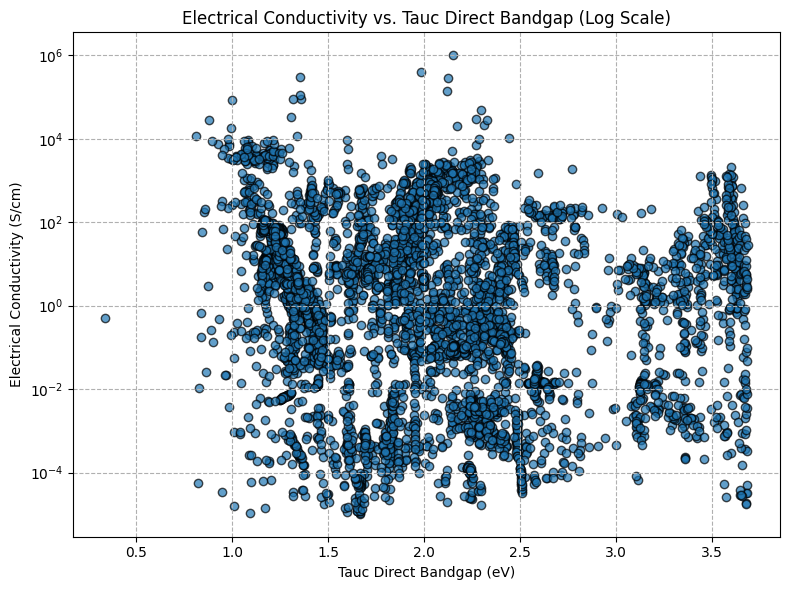

In [78]:
import matplotlib.pyplot as plt
import pandas as pd

# Check if the necessary columns are in the DataFrame
if 'fpm_conductivity' in valid_data.columns and 'calc_tauc_direct_bandgap_eV' in valid_data.columns:
    # Extract non-null conductivity and bandgap data
    filtered_data = valid_data[['fpm_conductivity', 'calc_tauc_direct_bandgap_eV']].dropna()

    # Convert to numeric for plotting, handling potential non-numeric entries
    filtered_data['fpm_conductivity'] = pd.to_numeric(filtered_data['fpm_conductivity'], errors='coerce')
    filtered_data['calc_tauc_direct_bandgap_eV'] = pd.to_numeric(filtered_data['calc_tauc_direct_bandgap_eV'], errors='coerce')
    filtered_data = filtered_data.dropna()  # Drop rows with non-numeric data
    
    conductivities = filtered_data['fpm_conductivity']
    bandgaps = filtered_data['calc_tauc_direct_bandgap_eV']

    # Plotting the data with a log scale for the y-axis
    plt.figure(figsize=(8, 6))
    plt.scatter(bandgaps, conductivities, alpha=0.7, edgecolors='k')
    plt.xscale('linear')
    plt.yscale('log')  # Setting y-axis to logarithmic scale
    plt.xlabel('Tauc Direct Bandgap (eV)')
    plt.ylabel('Electrical Conductivity (S/cm)')
    plt.title('Electrical Conductivity vs. Tauc Direct Bandgap (Log Scale)')
    plt.grid(True, which="both", ls="--")
    plt.tight_layout()
    plt.show()
else:
    print("The required columns ('fpm_conductivity', 'calc_tauc_direct_bandgap_eV') are not present in the DataFrame.")


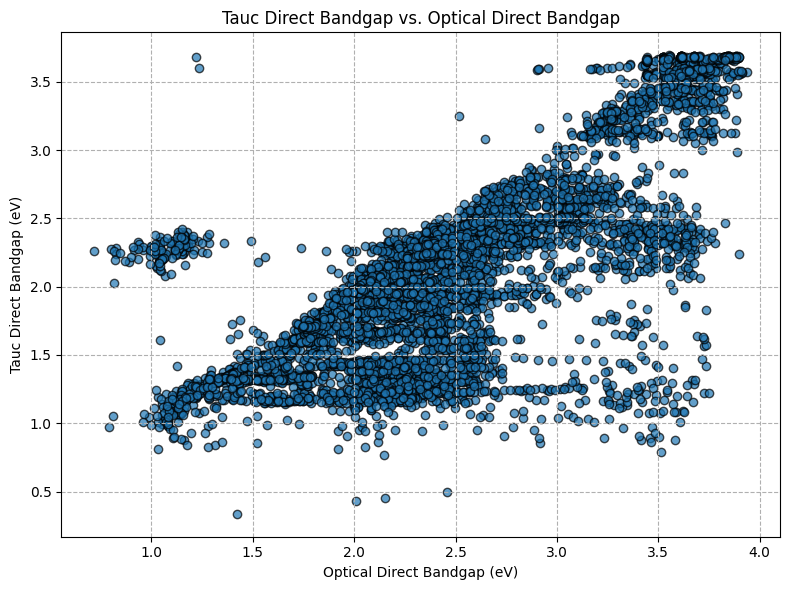

In [79]:
import matplotlib.pyplot as plt
import pandas as pd

# Check if the necessary columns are in the DataFrame
if 'calc_tauc_direct_bandgap_eV' in valid_data.columns and 'opt_direct_bandgap' in valid_data.columns:
    # Extract non-null bandgap data
    filtered_data = valid_data[['calc_tauc_direct_bandgap_eV', 'opt_direct_bandgap']].dropna()

    # Convert to numeric for plotting, handling potential non-numeric entries
    filtered_data['calc_tauc_direct_bandgap_eV'] = pd.to_numeric(filtered_data['calc_tauc_direct_bandgap_eV'], errors='coerce')
    filtered_data['opt_direct_bandgap'] = pd.to_numeric(filtered_data['opt_direct_bandgap'], errors='coerce')
    filtered_data = filtered_data.dropna()  # Drop rows with non-numeric data
    
    tauc_bandgaps = filtered_data['calc_tauc_direct_bandgap_eV']
    opt_bandgaps = filtered_data['opt_direct_bandgap']

    # Plotting the data
    plt.figure(figsize=(8, 6))
    plt.scatter(opt_bandgaps, tauc_bandgaps, alpha=0.7, edgecolors='k')
    plt.xlabel('Optical Direct Bandgap (eV)')
    plt.ylabel('Tauc Direct Bandgap (eV)')
    plt.title('Tauc Direct Bandgap vs. Optical Direct Bandgap')
    plt.grid(True, which="both", ls="--")
    plt.tight_layout()
    plt.show()
else:
    print("The required columns ('calc_tauc_direct_bandgap_eV', 'opt_direct_bandgap') are not present in the DataFrame.")


Optimized value of A: 567955682.4844666


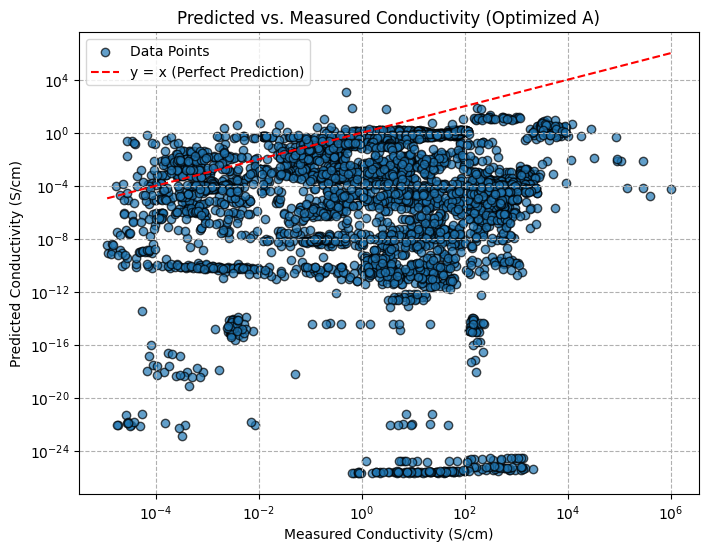

In [83]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize

# Constants
k_B = 8.617e-5  # Boltzmann constant in eV/K

# Function to model the electrical conductivity based on the bandgap and parameter A
def conductivity_model(bandgap, temperature, A):
    return A * temperature**(-1.5) * np.exp(-bandgap / (2 * k_B * temperature))

# Objective function to minimize: sum of squared differences between measured and calculated conductivities
def objective_function(A, bandgaps, temperatures, measured_conductivities):
    calculated_conductivities = conductivity_model(bandgaps, temperatures, A)
    return np.sum((measured_conductivities - calculated_conductivities)**2)

# Ensure required columns are present
if 'calc_tauc_direct_bandgap_eV' in valid_data.columns and 'absolute_temp_c' in valid_data.columns and 'fpm_conductivity' in valid_data.columns:
    # Filter rows with non-null values in the required columns
    filtered_data = valid_data[['calc_tauc_direct_bandgap_eV', 'absolute_temp_c', 'fpm_conductivity']].dropna()

    # Convert temperature to Kelvin
    filtered_data['absolute_temp_k'] = filtered_data['absolute_temp_c'] + 273.15

    # Extract measured conductivity, bandgap, and temperature
    measured_conductivities = filtered_data['fpm_conductivity'].values
    bandgaps = filtered_data['calc_tauc_direct_bandgap_eV'].values
    temperatures = filtered_data['absolute_temp_k'].values

    # Ensure valid values (positive conductivities and bandgaps)
    valid_indices = (measured_conductivities > 0) & (bandgaps > 0) & (temperatures > 0)
    measured_conductivities = measured_conductivities[valid_indices]
    bandgaps = bandgaps[valid_indices]
    temperatures = temperatures[valid_indices]

    # Define initial guess for A
    initial_A = 1e20

    # Minimize the objective function
    result = minimize(
        objective_function,
        initial_A,
        args=(bandgaps, temperatures, measured_conductivities),
        method='Nelder-Mead'
    )

    # Extract the optimized value of A
    optimized_A = result.x[0]
    print(f"Optimized value of A: {optimized_A}")

    # Calculate predicted conductivities using the optimized A
    predicted_conductivities = conductivity_model(bandgaps, temperatures, optimized_A)

    # Plot predicted vs. measured conductivity
    plt.figure(figsize=(8, 6))
    plt.scatter(measured_conductivities, predicted_conductivities, alpha=0.7, edgecolors='k', label="Data Points")
    plt.plot([measured_conductivities.min(), measured_conductivities.max()],
             [measured_conductivities.min(), measured_conductivities.max()],
             color='red', linestyle='--', label="y = x (Perfect Prediction)")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Measured Conductivity (S/cm)')
    plt.ylabel('Predicted Conductivity (S/cm)')
    plt.title('Predicted vs. Measured Conductivity (Optimized A)')
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()
else:
    print("The required columns ('calc_tauc_direct_bandgap_eV', 'absolute_temp_c', 'fpm_conductivity') are not present in the DataFrame.")


## Take the minimum of direct or indirect bandgap

Optimized value of A: 19303308.95127952


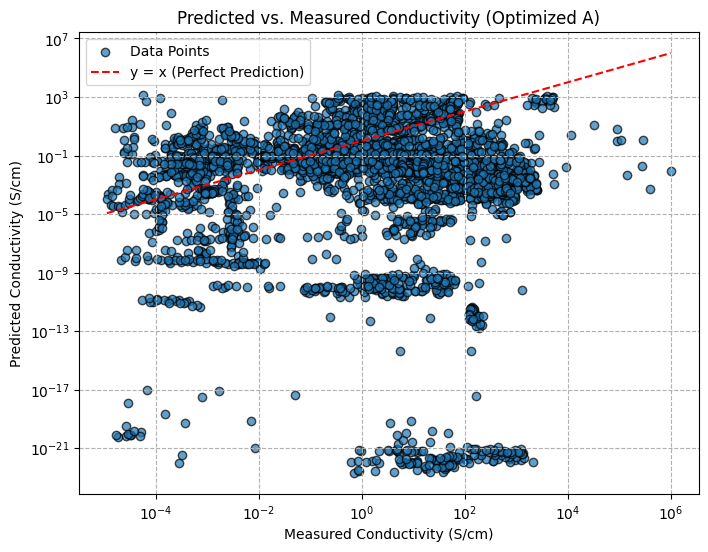

In [84]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize

# Constants
k_B = 8.617e-5  # Boltzmann constant in eV/K

# Function to model the electrical conductivity based on the bandgap and parameter A
def conductivity_model(bandgap, temperature, A):
    return A * temperature**(-1.5) * np.exp(-bandgap / (2 * k_B * temperature))

# Objective function to minimize: sum of squared differences between measured and calculated conductivities
def objective_function(A, bandgaps, temperatures, measured_conductivities):
    calculated_conductivities = conductivity_model(bandgaps, temperatures, A)
    return np.sum((measured_conductivities - calculated_conductivities)**2)

# Ensure required columns are present
if 'calc_tauc_direct_bandgap_eV' in valid_data.columns and 'absolute_temp_c' in valid_data.columns and 'fpm_conductivity' in valid_data.columns:
    # Filter rows with non-null values in the required columns
    filtered_data = valid_data[['calc_tauc_direct_bandgap_eV', 'calc_tauc_indirect_bandgap_eV','absolute_temp_c', 'fpm_conductivity']].dropna()

    # Convert temperature to Kelvin
    filtered_data['absolute_temp_k'] = filtered_data['absolute_temp_c'] + 273.15

    # Extract measured conductivity, bandgap, and temperature
    measured_conductivities = filtered_data['fpm_conductivity'].values
    direct_bandgaps = filtered_data['calc_tauc_direct_bandgap_eV'].values
    indirect_bandgaps = filtered_data['calc_tauc_indirect_bandgap_eV'].values
    temperatures = filtered_data['absolute_temp_k'].values

    bandgaps = np.minimum(direct_bandgaps, indirect_bandgaps)

    # Ensure valid values (positive conductivities and bandgaps)
    valid_indices = (measured_conductivities > 0) & (bandgaps > 0) & (temperatures > 0)
    measured_conductivities = measured_conductivities[valid_indices]
    bandgaps = bandgaps[valid_indices]
    temperatures = temperatures[valid_indices]

    # Define initial guess for A
    initial_A = 1e20

    # Minimize the objective function
    result = minimize(
        objective_function,
        initial_A,
        args=(bandgaps, temperatures, measured_conductivities),
        method='Nelder-Mead'
    )

    # Extract the optimized value of A
    optimized_A = result.x[0]
    print(f"Optimized value of A: {optimized_A}")

    # Calculate predicted conductivities using the optimized A
    predicted_conductivities = conductivity_model(bandgaps, temperatures, optimized_A)

    # Plot predicted vs. measured conductivity
    plt.figure(figsize=(8, 6))
    plt.scatter(measured_conductivities, predicted_conductivities, alpha=0.7, edgecolors='k', label="Data Points")
    plt.plot([measured_conductivities.min(), measured_conductivities.max()],
             [measured_conductivities.min(), measured_conductivities.max()],
             color='red', linestyle='--', label="y = x (Perfect Prediction)")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Measured Conductivity (S/cm)')
    plt.ylabel('Predicted Conductivity (S/cm)')
    plt.title('Predicted vs. Measured Conductivity (Optimized A)')
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()
else:
    print("The required columns ('calc_tauc_direct_bandgap_eV', 'absolute_temp_c', 'fpm_conductivity') are not present in the DataFrame.")


## Is thickness the issue?

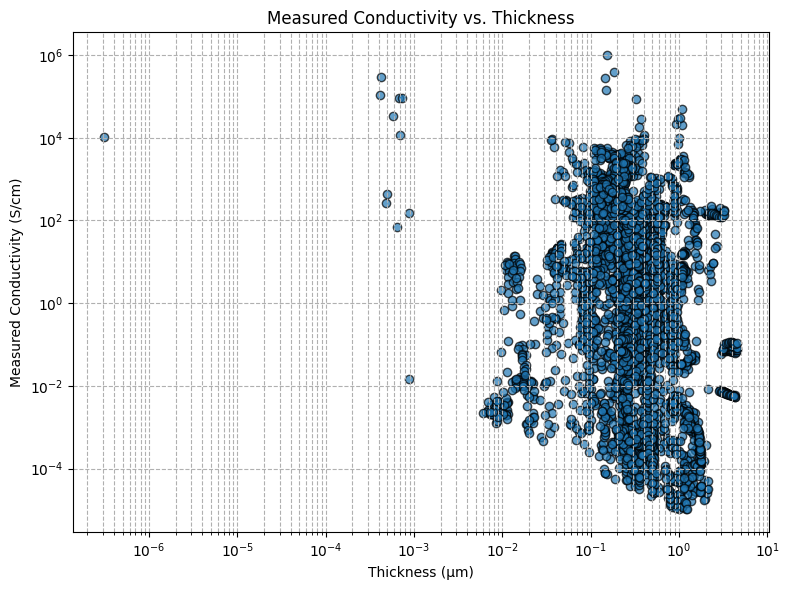

In [86]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Ensure that the required columns are present in valid_data
if 'thickness' in valid_data.columns and 'fpm_conductivity' in valid_data.columns:
    # Filter rows with non-null and positive thickness and conductivity values
    conductivity_data = valid_data[['thickness', 'fpm_conductivity']].dropna()
    conductivity_data = conductivity_data[(conductivity_data['thickness'] > 0) &
                                          (conductivity_data['fpm_conductivity'] > 0)]
    
    # Create a scatter plot of measured conductivity vs. thickness
    plt.figure(figsize=(8, 6))
    plt.scatter(conductivity_data['thickness'], conductivity_data['fpm_conductivity'], 
                alpha=0.7, edgecolors='k')
    plt.xlabel('Thickness (μm)')
    plt.ylabel('Measured Conductivity (S/cm)')
    plt.title('Measured Conductivity vs. Thickness')
    plt.xscale('log')
    plt.yscale('log')  # Use log scale for conductivity if values span several orders of magnitude
    plt.grid(True, which="both", ls="--")
    plt.tight_layout()
    plt.show()
else:
    print("The required columns ('thickness', 'fpm_conductivity') are not present in valid_data.")


## Examine worst predictions to verify Tauc Analysis Correct

Optimized value of A: 19303308.95127952


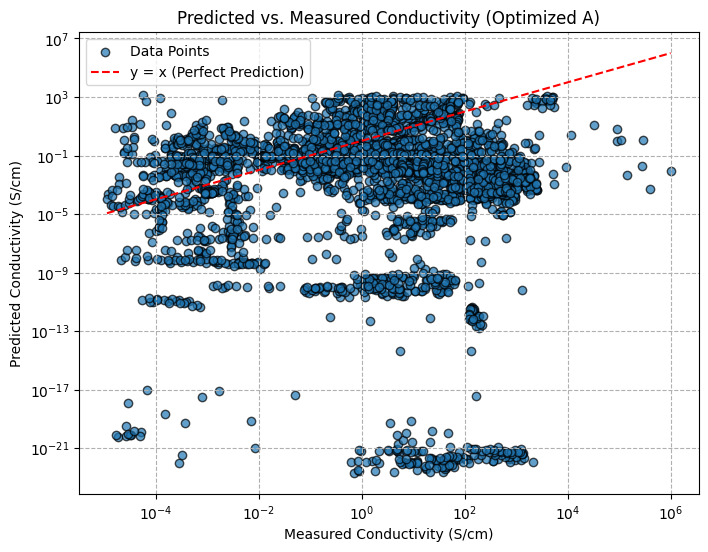

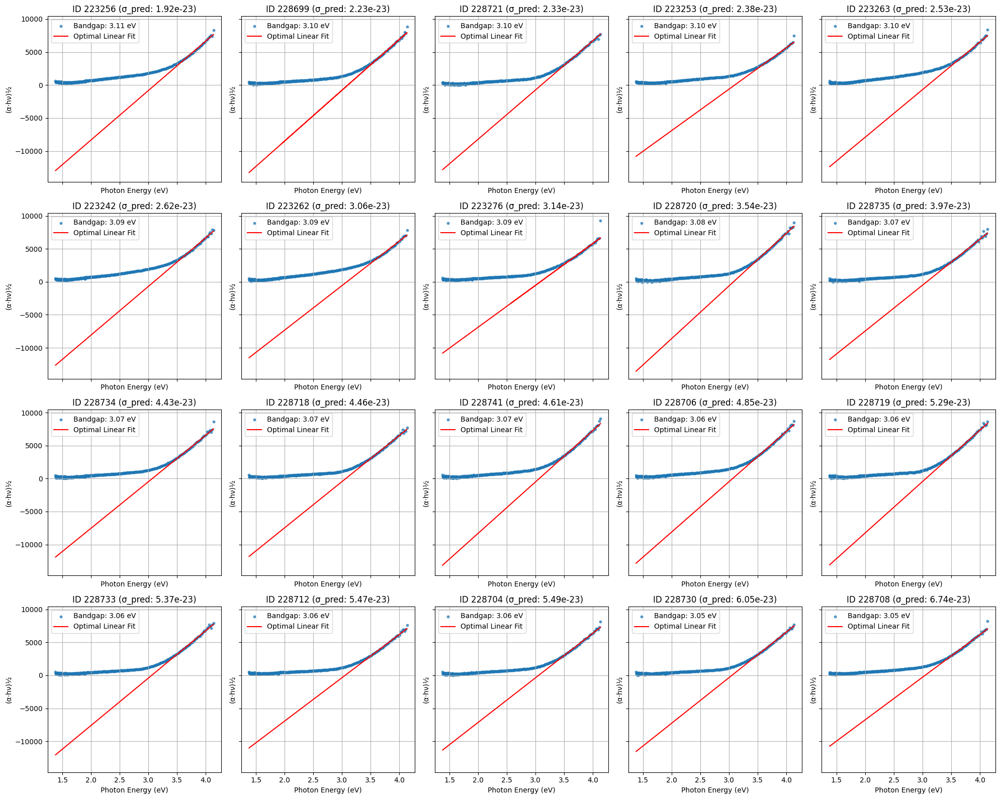

Average Bandgap (Direct) from Tauc analysis: 3.08 eV


In [100]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
np.seterr(all='ignore')
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import minimize
from scipy import stats

# --- Ensure the required columns are present ---
required_cols = ['calc_tauc_indirect_bandgap_eV', 'absolute_temp_c', 'fpm_conductivity']
if all(col in valid_data.columns for col in required_cols):
    # Filter rows with non-null values in the required columns but keep all columns
    filtered_data = valid_data.dropna(subset=required_cols).copy()
    
    # Convert temperature to Kelvin
    filtered_data['absolute_temp_k'] = filtered_data['absolute_temp_c'] + 273.15

    # Extract measured conductivity, bandgap, and temperature as arrays
    measured_conductivities = filtered_data['fpm_conductivity'].values
    bandgaps = filtered_data['calc_tauc_indirect_bandgap_eV'].values
    temperatures = filtered_data['absolute_temp_k'].values

    # Ensure valid values (positive conductivities, bandgaps, and temperatures)
    valid_indices = (measured_conductivities > 0) & (bandgaps > 0) & (temperatures > 0)
    filtered_data = filtered_data[valid_indices].copy()
    measured_conductivities = measured_conductivities[valid_indices]
    bandgaps = bandgaps[valid_indices]
    temperatures = temperatures[valid_indices]

    # --- Define the conductivity model and objective function ---
    k_B = 8.617e-5  # Boltzmann constant in eV/K

    def conductivity_model(bandgap, temperature, A):
        return A * temperature**(-1.5) * np.exp(-bandgap / (2 * k_B * temperature))

    def objective_function(A, bandgaps, temperatures, measured_conductivities):
        calculated = conductivity_model(bandgaps, temperatures, A)
        return np.sum((measured_conductivities - calculated)**2)

    # Initial guess for A
    initial_A = 1e20

    # Minimize the objective function to optimize A
    result = minimize(
        objective_function,
        initial_A,
        args=(bandgaps, temperatures, measured_conductivities),
        method='Nelder-Mead'
    )
    optimized_A = result.x[0]
    print(f"Optimized value of A: {optimized_A}")

    # Calculate predicted conductivities using the optimized A
    predicted_conductivities = conductivity_model(bandgaps, temperatures, optimized_A)
    # Attach the predicted conductivities to the filtered DataFrame (keeping all columns)
    filtered_data['predicted_conductivity'] = predicted_conductivities

    # --- Select the 20 samples with the lowest predicted conductivity ---
    lowest20 = filtered_data.nsmallest(20, 'predicted_conductivity').copy()
    #print("Lowest 20 samples (by predicted conductivity):")
    #print(lowest20)

    # --- (Optional) Plot measured vs. predicted conductivity ---
    plt.figure(figsize=(8, 6))
    plt.scatter(measured_conductivities, predicted_conductivities, alpha=0.7, edgecolors='k', label="Data Points")
    plt.plot([measured_conductivities.min(), measured_conductivities.max()],
             [measured_conductivities.min(), measured_conductivities.max()],
             color='red', linestyle='--', label="y = x (Perfect Prediction)")
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('Measured Conductivity (S/cm)')
    plt.ylabel('Predicted Conductivity (S/cm)')
    plt.title('Predicted vs. Measured Conductivity (Optimized A)')
    plt.legend()
    plt.grid(True, which="both", ls="--")
    plt.show()

    # --- Define the revised Tauc analysis function using the optimized linear region search ---
    def tauc_analysis(wavelengths, transmittances, thickness_um):
        # Convert thickness from micrometers to meters
        thickness_m = thickness_um * 1e-6  # Convert μm to m

        # Convert wavelength (nm) to energy (eV): E = hc/λ
        h = 6.62607015e-34  # J·s
        c = 3e8             # m/s
        eV_conversion = 1.60218e-19  # Joules to eV
        energy = (h * c) / (wavelengths * 1e-9) / eV_conversion  # Energy in eV

        # Calculate absorption coefficient (α) from transmittance data: α = -ln(T) / thickness
        alpha = -np.log(transmittances) / thickness_m

        # Calculate (α * hν)^1/2 for Tauc plot (indirect bandgap)
        alpha_hnu_1_2 = np.sqrt(alpha * energy)

        # Initialize variables for the optimal linear region
        best_slope = None
        best_intercept = None
        best_metric = float('inf')  # Metric = error^2 / slope^5
        best_bandgap = None

        # Define the window size and step size
        window_size = 0.5  # Energy range in eV
        step_size = 0.1    # Increment for moving the window

        min_energy = np.min(energy)
        max_energy = np.max(energy)

        for start in np.arange(min_energy, max_energy - window_size, step_size):
            end = start + window_size
            mask = (energy >= start) & (energy <= end)
            if np.sum(mask) >= 2:  # At least 2 points required for fitting
                slope, intercept, _, _, _ = stats.linregress(energy[mask], alpha_hnu_1_2[mask])
                error = np.mean((alpha_hnu_1_2[mask] - (slope * energy[mask] + intercept)) ** 2)
                if slope > 0:
                    metric = error**2 / slope**5
                    if metric < best_metric:
                        best_metric = metric
                        best_slope = slope
                        best_intercept = intercept
                        best_bandgap = -intercept / slope  # Bandgap from x-intercept

        return best_bandgap, energy, alpha_hnu_1_2, best_slope, best_intercept

    # --- Plot Tauc curves for the 20 selected samples ---
    # Create a grid of subplots (4 rows x 5 columns)
    fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
    axes = axes.ravel()

    bandgaps_tauc = []
    for idx, (i, row) in enumerate(lowest20.iterrows()):
        wavelengths = np.array(row['opt_wavelength'])
        transmittances = np.array(row['opt_normalized_transmittance'])
        thickness_um = row['thickness']
        
        # Truncate wavelengths to ≤ 900 nm
        mask = wavelengths <= 900
        truncated_wavelengths = wavelengths[mask]
        truncated_transmittances = transmittances[mask]
        
        try:
            bandgap, energy, alpha_hnu_1_2, best_slope, best_intercept = tauc_analysis(truncated_wavelengths, truncated_transmittances, thickness_um)
            bandgaps_tauc.append(bandgap)
            ax = axes[idx]
            ax.scatter(energy, alpha_hnu_1_2, s=10, alpha=0.7, label=f'Bandgap: {bandgap:.2f} eV')
            # Plot the optimal linear fit using the best slope and intercept from the window search
            ax.plot(energy, best_slope * energy + best_intercept, color='red', label='Optimal Linear Fit')
            ax.set_title(f"ID {row['id']} (σ_pred: {row['predicted_conductivity']:.2e})")
            ax.set_xlabel('Photon Energy (eV)')
            ax.set_ylabel('(α·hν)½')
            ax.legend()
            ax.grid(True)
        except Exception as e:
            axes[idx].text(0.5, 0.5, 'Error in Tauc analysis', ha='center', va='center', transform=axes[idx].transAxes)

    # Hide any unused subplots
    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # Calculate and print the average bandgap from the Tauc analysis
    avg_bandgap_tauc = np.nanmean(bandgaps_tauc)
    print(f"Average Bandgap (Direct) from Tauc analysis: {avg_bandgap_tauc:.2f} eV")
else:
    print("The required columns ('calc_tauc_indirect_bandgap_eV', 'absolute_temp_c', 'fpm_conductivity') are not present in the DataFrame.")


# Practice

Explore the NREL HTEM database

1. **Examine what compositions exist within the dataset.**  
   We tried to perform a bulk analysis of all the data on the HTEM database, but this was unsuccessful due to the diversity of materials present.  
   - **(a)** Create a 2D cluster graph to visualize the groupings of material compositions present in the NREL database.  
   - **(b)** Create a bar chart with the y-axis as the fraction of the total data present in the NREL database, and the x-axis as the material compositions.  

   > **Note:** There are many possible ways to approach these tasks, so choose the method that makes the most sense to you.

2. **Examine the other data available on the HTEM database.**  
   In class today we examined the optical and electronic data on the HTEM database. Other data available on the HTEM database include: Process settings, X-ray Fluorescence (XRF), and X-ray Diffraction (XRD).

   Now, complete the following:  
   - **(a)** Look up and describe in your own words what information XRF and XRD measurements provide.  
   - **(b)** Examine the XRF and XRD data in `combined_libraries_data_df`—which keys point to this data, and what does this data represent?  
   - **(c)** Create a heatmap visualization of the XRD data available in at least one of the HTEM libraries.
